# 1. Setup

In [1]:
feature_grps = None
plot_tree = None
r2_score = None
shap_dur = None
shap_level = None
shap_logd = None
shap_values = None
trips = None
Xlong = None
Xwide = None

In [ ]:
from time import time

from catboost import CatBoostRegressor
import lightgbm as lgbm
from scipy.interpolate import CubicSpline
from scipy.stats import entropy, gaussian_kde
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import LinearRegression, SGDRegressor, ElasticNet, BayesianRidge
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR, NuSVR
from sklearn.tree import DecisionTreeRegressor
import plotly.express as px
import shap
import sklearn as skl
import xgboost as xgb

from utils import *

# 2. Prepare data

## 2.1. Download

In [2]:
# %%bash
# # t=0:07
# path=../data/nhts/2017
# mkdir -p $path; cd $path
# url="https://nhts.ornl.gov/assets/2016/download/csv.zip"
# wget $url
# unzip csv.zip

## 2.2. Load trips

In [3]:
# t=0:08
tripUS = pd.read_csv('../data/nhts/trippub.csv').rename(columns=str.lower).disp()

923,572 rows x 115 cols; Memory: 1037.8 MiB


,houseid,personid,tdtrpnum,strttime,endtime,trvlcmin,trpmiles,trptrans,trpaccmp,trphhacc,...,obhtnrnt,obppopdn,obresdn,dthtnrnt,dtppopdn,dtresdn,dteempdn,dbhtnrnt,dbppopdn,dbresdn
,<int64>,<int64>,<int64>,<int64>,<int64>,<int64>,<float64>,<int64>,<int64>,<int64>,...,<int64>,<int64>,<int64>,<int64>,<int64>,<int64>,<int64>,<int64>,<int64>,<int64>
0,30000007,1,1,1000,1015,15,5.244,3,0,0,...,20,750,300,50,750,300,350,30,300,300


In [4]:
def get_trip_data(trip=tripUS):
    df = Pdf()
    def cut(col: str, bins: list[float], labels: list[str]) -> pd.Categorical:
        return pd.cut(trip[col], [-INF] + bins + [INF], True, labels)
    def classify(col: str, mapping: dict) -> pd.Categorical:
        cats = Series(list(mapping.values())).drop_duplicates().to_list()
        return pd.Categorical(trip[col].map(mapping), categories=cats)
    ## Deterrence measures
    df['Distance'] = trip['trpmiles'] * MI2M / 1000 # in km
    df['Duration'] = trip['trvlcmin'] # in minutes
    df['Speed'] = (df.Distance / (df.Duration / 60)) # in km/h
    for col, vmax in D(Distance=200, Duration=120, Speed=100).items():
        df.loc[(df[col] <= 0) | (df[col] > vmax), col] = np.nan
    df['LogDistance'] = np.log10(1 + df.Distance * 1000) # distance in meters
    # estimated gas price in $ assuming a constant mileage of 20 mi/ga
    # df['Cost'] = (trip['gasprice'] / 100) * (df.Distance * 1000 / MI2M) / 20
    df['TripWeight'] = normalize(trip['wttrdfin'])
    ## Trip attributes
    df['Mode'] = classify('trptrans', {x: 'drive' for x in [3, 4, 5, 6, 17, 18]} | 
                                      {x: 'transit' for x in [10, 11, 12, 13, 14, 15, 16]} |
                                      {1: 'walk', 2: 'bike'})
    df['HomeBased'] = (trip['trippurp'] == 'NHB').map({False: 'yes', True: 'no'})
    df['Purpose'] = classify('whytrp90', {1: 'work', 2: 'work', 3: 'shopping',
                                          4: 'social', 5: 'school/church', 6: 'medical',
                                          8: 'social', 10: 'recreation'})
    df['Weekend'] = classify('tdwknd', {1: 'yes', 2: 'no'})
    df['Occupancy'] = cut('numontrp', [1, 2], ['single', 'pair', 'multiple'])
    df['GasPrice'] = cut('gasprice', [233, 267], ['low', 'mid', 'high'])
    df['StartTime'] = (pd.cut(trip['strttime'], [0, 600, 900, 1600, 1900, 2400], labels=[
        'off_peak', 'morn_peak', 'off_peak', 'eve_peak', 'off_peak'], ordered=False)
                       .cat.reorder_categories(['morn_peak', 'eve_peak', 'off_peak']))
    df['StayTime'] = cut('dweltime', [60, 480], ['short', 'mid', 'long'])
    ## SES of respondent/household
    df['Age'] = normalize(trip['r_age'].clip(0, 80))
    df['AgeGrp'] = cut('r_age', [0, 30, 64], ['n/a', 'young', 'mid', 'senior'])
    df['Sex'] = classify('r_sex', {1: 'male', 2: 'female'})
    df['Race'] = classify('hh_race', {1: 'white'} | {x: 'nonwhite' for x in [2, 3, 4, 5, 6]})
    df['Hispanic'] = classify('hh_hisp', {1: 'yes', 2: 'no'})
    df['Education'] = cut('educ', [0, 2], ['n/a', 'school', 'college'])
    df['Worker'] = classify('worker', {1: 'yes', 2: 'no'})
    df['Income'] = cut('hhfaminc', [0, 5, 7], ['n/a', 'low', 'mid', 'high'])
    df['HomeOwn'] = classify('homeown', {1: 'own', 2: 'rent'})
    ## Origin/destination attributes
    df['Region'] = cut('census_r', [1, 2, 3], ['northeast', 'midwest', 'south', 'west'])
    df['MSAKind'] = classify('msacat', {1: 'big_rail', 2: 'big_norail', 3: 'small', 4: 'not_msa'})
    df['UrbanO'] = classify('obhur', D(C='urban', S='suburban', T='suburban', U='urban', R='rural'))
    df['UrbanD'] = classify('dbhur', D(C='urban', S='suburban', T='suburban', U='urban', R='rural'))
    df['PopDensity'] = cut('otppopdn', [0, 1000, 4000], ['n/a', 'low', 'mid', 'high'])
    df['HouseDensity'] = cut('otresdn', [0, 500, 2000], ['n/a', 'low', 'mid', 'high'])
    df['EmpDensity'] = cut('dteempdn', [0, 500, 2000], ['n/a', 'low', 'mid', 'high'])
    ## Remove bad dataa
    df = df.replace('n/a', None)
    print('NaNs: ' + ' '.join([f'{k}={v:,}' for k, v in df.isna().sum().items() if v > 0]))
    df = df.dropna()
    for col in df.select_dtypes('object'):
        df[col] = df[col].astype(CAT)
    return df

data = get_trip_data().disp(2)

NaNs: Distance=9,530 Duration=13,345 Speed=19,562 LogDistance=9,530 Mode=9,540 Purpose=35,779 StartTime=544 AgeGrp=1,216 Sex=711 Race=19,553 Hispanic=1,002 Education=65,579 Worker=79,323 Income=24,340 HomeOwn=6,308 UrbanO=980 UrbanD=962 PopDensity=973 HouseDensity=973 EmpDensity=955
739,304 rows x 29 cols; Memory: 55.7 MiB


,Distance,Duration,Speed,LogDistance,TripWeight,Mode,HomeBased,Purpose,Weekend,Occupancy,...,Worker,Income,HomeOwn,Region,MSAKind,UrbanO,UrbanD,PopDensity,HouseDensity,EmpDensity
,<float64>,<float64>,<float64>,<float64>,<float64>,<category>,<category>,<category>,<category>,<category>,...,<category>,<category>,<category>,<category>,<category>,<category>,<category>,<category>,<category>,<category>
0,8.439379,15.0,33.757516,3.926362,0.006319,drive,yes,school/church,no,single,...,no,mid,own,south,small,suburban,suburban,mid,mid,low
1,8.286492,20.0,24.859475,3.918423,0.006319,drive,yes,school/church,no,single,...,no,mid,own,south,small,suburban,suburban,low,low,mid


## 2.3. Distributions

In [5]:
# for col in sorted(data.select_dtypes(CAT).columns):
#     print('*' * 50, f'{col}', sep='\n') #  (n={data[col].dropna().size:,})
#     print(', '.join([f'{k}={v:,}' for k, v in data[col].value_counts().sort_index().items()]))

In [6]:
# _, axes = plt.subplots(1, 3, figsize=(12, 3), dpi=150)
# colors = sns.color_palette('turbo', 3)
# for ax, color, (var, unit, vmax) in zip(axes, colors, [
#         ('Distance', 'km', 100), ('LogDistance', '', 6), ('Duration', 'min', 90)]):
#     ax = pplot(ax, title=var.title(), xlab=f'{var} ({unit})', yeng=1)
#     data[var].clip(0, vmax).hist(bins=50, ax=ax, color=color)

In [7]:
# ax = pplot(size=(5, 3), dpi=150, ylab='No. of trips', yeng=1, xlim=(0, 90),
#            title='Trip duration - Observed and fitted', xlab='Trip duration (min)')
# data.Duration.clip(0, 90).hist(bins=90, color='dodgerblue', alpha=0.3, ax=ax)
# twin = pplot(ax.twinx(), xlab='Duration (min)', ylab='', gridcolor='w')
# ax = sns.kdeplot(data.Duration, ax=twin, bw_adjust=2, clip=(1, 90), color='b', lw=1.2)
# ax.set_xticks(np.arange(0, 91, 15));

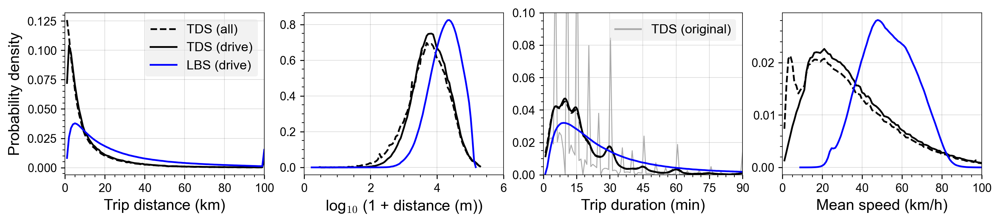

In [8]:
def fig_deterrence_distr(tds=data, size=(14, 2.5), dpi=150):
    sg = pd.read_parquet('../data/pois/odm2.parquet', filters=[
        ('duration', '>', 0), ('purpose', '==', 'Overall')
    ], columns=['visitors', 'distance', 'duration'])
    sg.distance /= 1000; sg.duration /= 60
    sg['speed'] = sg.distance / sg.duration * 60
    def hist(x, vmax=None, bins=100, wt=None):
        y, x = np.histogram(x.clip(0, vmax), bins, density=True, weights=wt)
        return x[1:], y
    _, axes = plt.subplots(1, 4, figsize=size, dpi=dpi)
    drive = tds.query('Mode == "drive"')
    ## Distance
    ax = pplot(axes[0], ylog=0, xlab='Trip distance (km)',
               ylab='Probability density', xlim=(0, 100))
    ax.plot(*hist(tds.Distance, 100), color='k', ls='--', label='TDS (all)')
    ax.plot(*hist(drive.Distance, 100), color='k', label='TDS (drive)')
    ax.plot(*hist(sg.distance, 100), color='b', label='LBS (drive)')
    ax.legend(loc='upper right', handles=[mpl.lines.Line2D(
        [0], [0], color=c, ls=ls, label=x) for x, c, ls in [
            ('TDS (all)', 'k', '--'), ('TDS (drive)', 'k', '-'), 
            ('LBS (drive)', 'b', '-')]])
    ## LogDistance
    ax = pplot(axes[1], ylog=0, xlab='log$_{10}$ (1 + distance (m))',
               ylab='Probability density', xlim=(0, 6))
    ax.plot(*hist(tds.LogDistance, 100), color='k', ls='--', label='TDS (all)')
    ax.plot(*hist(drive.LogDistance, 100), color='k', label='TDS (drive)')
    ax.plot(*hist(np.log10(1 + sg.distance * 1000), 100), color='b', label='LBS (drive)')
    ax.set_ylabel('')
    ## Duration
    ax = pplot(axes[2], xlab='Trip duration (min)', ylim=(0, 0.1), xlim=(0, 90))
    ax.plot(*hist(tds.Duration, 90), color='#aaa', lw=0.8, label='TDS (original; all)')
    ax = sns.kdeplot(tds.Duration, ax=ax, bw_adjust=1.75, clip=(1, 90), 
                     color='k', ls='--', label='TDS (smooth; all)')
    ax = sns.kdeplot(drive.Duration, ax=ax, bw_adjust=1.75, clip=(1, 90), 
                     color='k', label='TDS (smooth; drive)')
    ax.set_ylabel('')
    ax.plot(*hist(sg.duration, 90), color='b', label='LBS (drive)')
    ax.set_xticks(np.arange(0, 91, 15))
    ax.legend(loc='upper right', handles=[mpl.lines.Line2D(
        [0], [0], color='#aaa', label='TDS (original)')])
    ## Speed
    ax = pplot(axes[3], xlab='Mean speed (km/h)', xlim=(0, 100))
    ax.plot(*hist(tds.Speed), color='k', ls='--', label='TDS (all)')
    ax.plot(*hist(drive.Speed), color='k', label='TDS (drive)')
    ax.plot(*hist(sg.speed), color='b', label='LBS (drive)')

x = fig_deterrence_distr(dpi=250); x # t=0:09

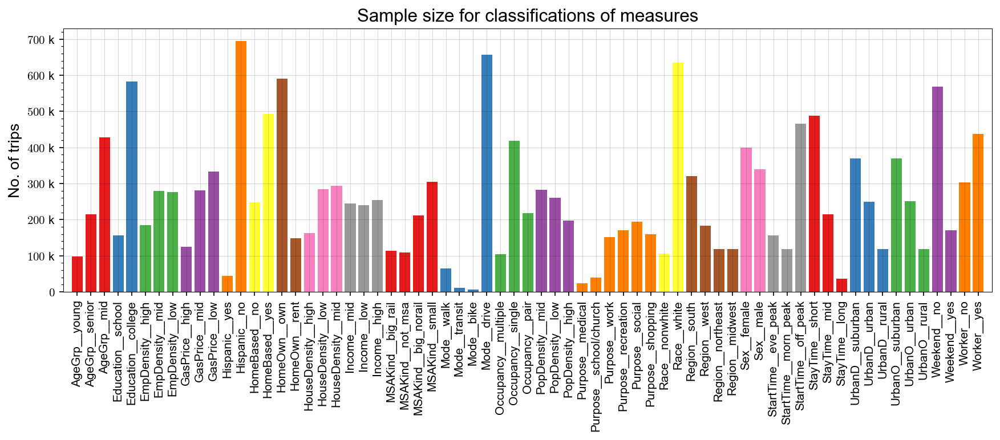

In [9]:
def plot_sample_sizes(data, size=(14, 4), dpi=150):
    df = pd.concat([data[col].value_counts().rename_axis('subcat')
                    .reset_index().assign(cat=col) 
                    for col in data.select_dtypes(CAT)])
    df = df.sort_values('cat')
    df['label'] = df.cat + '__' + df.subcat
    df['color'] = df.cat.map(dict(zip(df.cat.unique(), sns.color_palette(
        'Set1', df.cat.nunique()))))
    ax = pplot(size=size, dpi=dpi, ylab='No. of trips', xlim=(-1, len(df)), 
               title='Sample size for classifications of measures', yeng=1)
    ax.bar(df.label, df['count'], color=df.color)
    ax.tick_params(which='minor', bottom=False)
    plt.xticks(rotation=90)

plot_sample_sizes(data, dpi=150)

# 3. Finding important features

## 3.1. Interactive

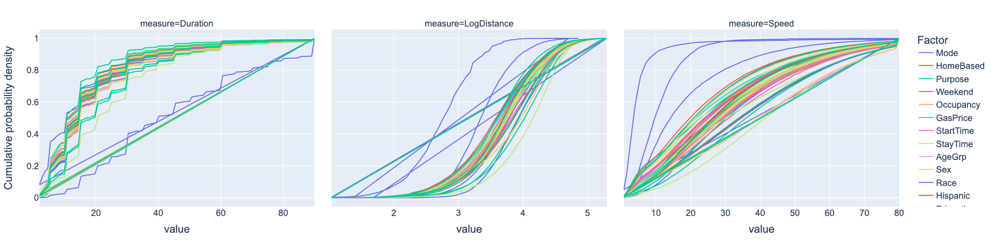

In [10]:
def plot_distr_vars(data=data, width=1600, height=500):
    res = []
    for measure, vmin, vmax in [('Duration', 0, 90), ('LogDistance', 1, 6), ('Speed', 0, 80)]:
        for var in data.select_dtypes(CAT):
            for cat, df in data.groupby(var):
                y, x = np.histogram(df[measure].clip(vmin, vmax), bins=100)
                y = (y / y.sum()).cumsum()
                res.append(Pdf(D(value=x[1:], density=y))
                           .assign(var=var, cat=cat, measure=measure))
    res = pd.concat(res).reset_index(drop=1)
    fig = px.line(res, x='value', y='density', color='var', facet_col='measure',
                  width=width, height=height, hover_name='cat', hover_data=['cat'],
                  labels=D(density='Cumulative probability density', var='Factor'))
    fig.update_layout(hoverlabel=D(bgcolor='white', font_size=16),
                      font=D(family='Arial', size=18))
    fig.for_each_xaxis(lambda x: x.update(matches=None))
    fig.show()

plot_distr_vars()

**Insights** from the distribution plots

**Major differences**:
- `mode` is the strongest determinant for trip length, with transit & driving trips much much longer than biking and walking trips. The trip duration distribution is pretty similar for driving, biking & walking, but transit trips take much more time.
    - `msakind`: Bigger MSAs travel longer than smaller places, esp. if they have subway systems
- `purpose`: Work and medical trips are the longest
    - similarly, `homebased` trips are longer than non-home-based
    - also, `workers` travel longer than non-workers
- `race`: Interestingly, people of color take much longer to travel than White people even though they cover nearly the same distances
    - `income`: Low-income people travel shorter distances even though they take nearly the same time as middle and high-income folks.
- `stay` duration: Longer stay warrants longer trips
- `ruralO`: People in rural areas travel much longer than urban folks
    - `ruralD`: Similarly, people going to rural areas travel longer than in urban destinations
    - `popdensity{O,D}`, `housedensity{O,D}`, `empdensity{O,D}`: Trips to and from low-density regions are much longer than between high-density regions

**Minor differences**:
- `age`: Older people travel shorter; adults travel longer
- `sex`: Males travel longer than females
- `gasprice`: Higher gas price pushes towards longer trips by distance, but not by duration.
- `region`: People in the South of the US travel slightly longer than those in the West and Midwest.
- `weekend`, `hispanic` status, `education`, household `income`, `homeown`: These variables don't influence trip duration much

## 3.2. KL divergence approach

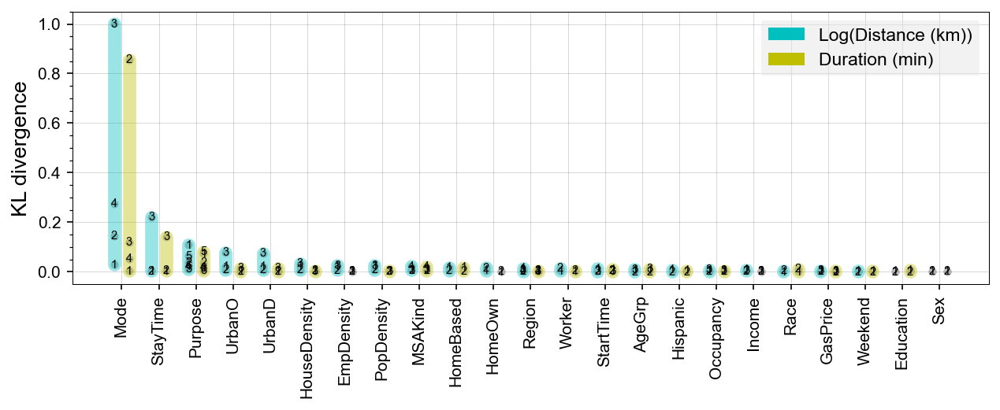

In [11]:
def plot_cat_entropy(data=data, size=(10, 3), dpi=150, gap=0.2):
    hist = lambda df: np.histogram(df.val, bins=100, density=True, weights=df.TripWeight)[0]
    ent = [] # table containing entropy values
    for var, vmin, vmax in [('LogDistance', 2, 5), ('Duration', 0, 90)]:
        data = data.assign(val=data[var].clip(vmin, vmax))
        all_hist = hist(data)
        for col in data.select_dtypes(CAT).columns:
            for j, (cat, df) in enumerate(data.groupby(col)):
                ent.append(D(var=var, col=col, cat_id=j, cat=cat, n=len(df),
                             entropy=entropy(hist(df), all_hist)))
    ent = Pdf(ent)#.rename_axis('index')
    # norm = ent.groupby('var').entropy.apply(normalize).reset_index()
    # ent = ent.drop(columns='entropy').merge(norm, on=('var', 'index'))
    cols = ent.groupby(['var', 'col']).entropy.agg(['min', 'max']).reset_index()
    cols['range'] = cols['max'] - cols['min']
    col_ids = (cols.query('var=="LogDistance"').set_index('col')['range']
               .sort_values(ascending=0).reset_index().rename_axis('col_id'))
    cols = cols.merge(col_ids['col'].reset_index(), on='col')
    cols['x'] = cols.col_id + gap * 2 * ((cols['var'] == 'Duration') - 0.5)
    ent = ent.merge(cols[['var', 'col', 'col_id', 'x']], on=('var', 'col'))
    ax = pplot(size=size, dpi=dpi, ylab='KL divergence', ylog=0)
    for var, color in [('LogDistance', 'c'), ('Duration', 'y')]:
        df = ent.query(f'var=="{var}"')
        ax.scatter(df.x, df.entropy, s=15, color='#bbb')
        for _, r in df.iterrows():
            ax.text(r.x, r.entropy, str(r.cat_id + 1), fontsize=7,
                    color='k', ha='center', va='center')
        for _, r in cols.query(f'var=="{var}"').iterrows():
            ax.add_artist(mpl.lines.Line2D(
                [r.x, r.x], [r['min'], r['max']], lw=8, 
                alpha=0.4, color=color, solid_capstyle='round'))
    ax.set_xticks(ent.col_id.unique(), ent.col.unique(), fontsize=10, rotation=90)
    ax.tick_params(which='minor', bottom=False)
    ax.legend(handles=[mpl.patches.Patch(fc=c, label=x, ec='none') for x, c in [
        ('Log(Distance (km))', 'c'), ('Duration (min)', 'y')]])

x = plot_cat_entropy(dpi=150); x

## 3.3. Main distributions

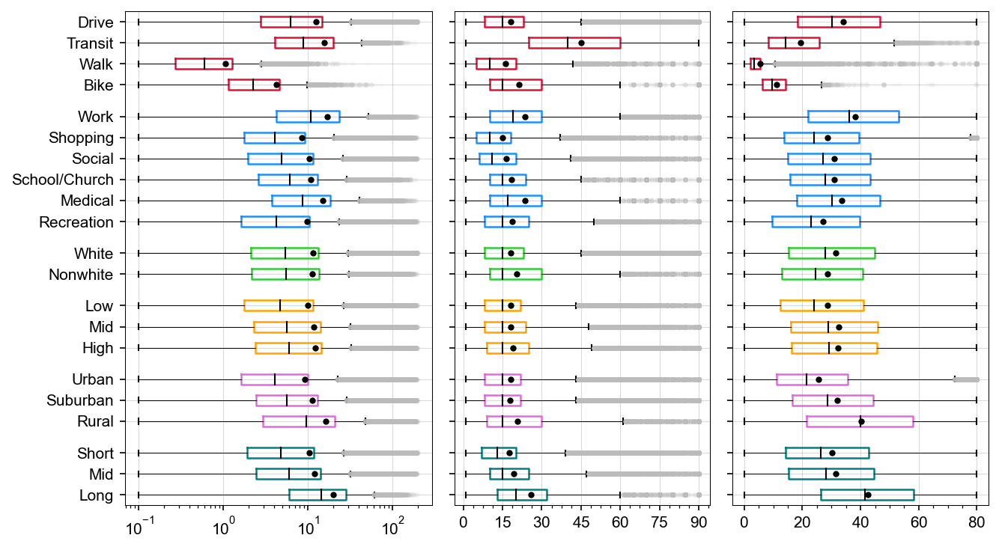

In [12]:
def plot_distr_box(data=data, size=(9, 5), dpi=150):
    _, axes = plt.subplots(1, 3, figsize=size, dpi=dpi, 
                             gridspec_kw=D(width_ratios=[1.2, 1, 1]))
    cols = D(Mode='crimson', Purpose='dodgerblue', Race='limegreen',
             Income='orange', UrbanO='orchid', StayTime='teal')
    ticker = mpl.ticker.EngFormatter(places=1)
    for j, var, rng, title in [(0, 'Distance', (0.1, 1000), 'Trip length (km)'),
                               (1, 'Duration', (0, 90), 'Trip duration (min)'),
                               (2, 'Speed', (0, 80), 'Speed (km/h)')]:
        df = Pdf(sum([[D(col=col, cat=x[0].title().replace('_', ' '),
                         vals=x[1].values, pos=i / 2, n=ticker(len(x[1]))) 
                       for x in data.groupby(col)[var]]
                      for i, col in enumerate(cols.keys())], []))
        df.vals = [x.clip(*rng) for x in df.vals]
        df['color'] = df.col.map(cols)
        ax = pplot(axes[j], xlog=var == 'Distance')
        x = ax.boxplot(df.vals, positions=df.pos + df.index,
                       labels=df.cat,# + ' (' + df.n + ')',
                       vert=False, whiskerprops=D(lw=0.5), boxprops=D(lw=1.2),
                       flierprops=D(markersize=2, markeredgecolor='#bbb1'),
                       showmeans=True, meanline=False, meanprops=D(
                           marker='o', markersize=4, 
                           markeredgecolor='none', markerfacecolor='k'),
                       medianprops=D(color='k'))
        for box, color in zip(x['boxes'], df.color):
            box.set_color(color)
        ax.tick_params(which='minor', left=False)
        ax.invert_yaxis()
        if var == 'Duration': ax.set_xticks(np.arange(0, 91, 15))
        if j != 0: ax.set_yticklabels([])
    plt.tight_layout()

x = plot_distr_box(dpi=150); x

## 3.4. Density & urbanity

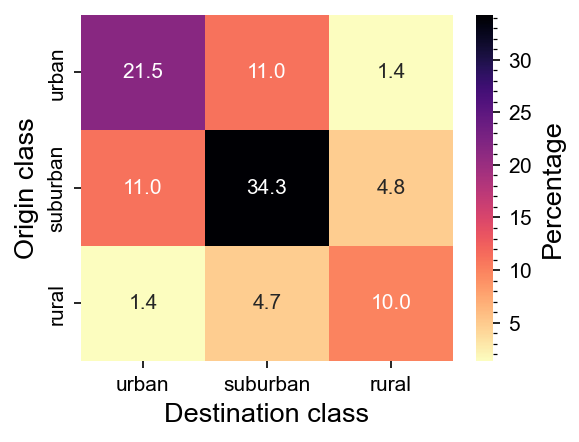

In [13]:
ax = pplot(size=(4, 3), dpi=150)
sns.heatmap(data[['UrbanO', 'UrbanD']].value_counts()
            .pipe(lambda x: x / x.sum() * 100).reset_index()
            .pivot_table('count', 'UrbanO', 'UrbanD'),
            ax=ax, cmap='magma_r', annot=True, fmt='.1f',
            cbar_kws=D(label='Percentage'))
ax.minorticks_off(); ax.grid(False)
ax = pplot(ax, xlab='Destination class', ylab='Origin class')

# 4. Modeling

## 4.1. Data preparation

In [14]:
class Dataset:
    def __init__(self, var, test_ratio, n=None, 
                 wide=False, data=data, seed=1234):
        if isinstance(n, int):
            data = data.sample(n, random_state=seed)
        self.X = data.select_dtypes(CAT)
        if wide:
            self.X = pd.get_dummies(self.X, prefix_sep='__')
        self.y = data[var]
        self.Xtrain, self.Xtest, self.ytrain, self.ytest = \
            skl.model_selection.train_test_split(
                self.X, self.y, test_size=test_ratio, random_state=seed)
        # self.Xtrain, self.Xval, self.ytrain, self.yval = \
        #     skl.model_selection.train_test_split(
        #         Xtrain, ytrain, random_state=seed,
        #         test_size=val_ratio / (1 - test_ratio))
        wts = data['TripWeight'].rename('weight')
        self.wtrain = wts.loc[self.Xtrain.index]
        self.wtest = wts.loc[self.Xtest.index]
        
    def fit(self, model, **kwargs):
        return model.fit(self.Xtrain, self.ytrain, **kwargs)
    
    def predict(self, model, **kwargs):
        return model.predict(self.Xtest, **kwargs)
    
    def fit_predict(self, model):
        return model.fit(self.Xtrain, self.ytrain).predict(self.Xtest)
    
# dsAll = Dataset('Distance', 0.25)
dsTest = Dataset('Distance', 0.25, n=100_000)

## 4.2. General modeling

In [178]:
def test_models(models, ds: Dataset = dsTest, metrics=[
        'r2_score', 'mean_absolute_error', 'mean_squared_error']):
    res = []
    pbar = tqdm(models.items())
    for name, model in pbar:
        pbar.set_description(name)
        t = time()
        if name == 'Categorical Boost':
            model = ds.fit(model, verbose_eval=False)
        else:
            model = ds.fit(model)
        ypred = model.predict(ds.Xtest)
        perf = D(name=name, runtime=time() - t)
        for metric in metrics:
            func = getattr(skl.metrics, metric)
            perf[metric] = func(ds.ytest, ypred)
        res.append(perf)
    return Pdf(res)

models = {
    'Bayesian Ridge': BayesianRidge(), # ⭐️: ❌, ⏰: ✅
    'Categorical Boost': CatBoostRegressor(), # ⭐️: ✅, ⏰: ❌
    'ElasticNet': ElasticNet(), # ⭐️: ❌, ⏰: ✅
    'Gradient Boost': GradientBoostingRegressor(), # ⭐️: ✅, ⏰: ❌
    ## 'Kernel Ridge': KernelRidge(), # ⭐️: ❌, ⏰: ❌❌
    'Light Gradient Boost': lgbm.LGBMRegressor(force_row_wise=True), # ⭐️: ✅, ⏰: ✅
    'Linear Regression': LinearRegression(), # ⭐️: ❌, ⏰: ✅
    'Random Forest': RandomForestRegressor(n_jobs=-1), # ⭐️: 🥲, ⏰: 🥲
    'SGD Regression': SGDRegressor(), # ⭐️: ❌, ⏰: ✅
    ## 'Support Vector Regression': SVR(kernel='linear', degree=3), # ⭐️: ❌, ⏰: ❌❌
    'Extreme Gradient Boost': xgb.XGBRegressor(), # ⭐️: ✅, ⏰: ✅
}
np.random.seed(1234)
seeds = np.random.randint(0, 1e4, 10)
datasets = {x: Dataset('Distance', test_ratio=0.25, seed=x, wide=True) for x in seeds}
# ds = Dataset('Distance', test_ratio=0.25, wide=True)
# model_perf = pd.concat([test_models(models, ds=ds).assign(seed=seed)
#                         for seed, ds in datasets.items()]).disp() # t=12:42
# model_perf.to_csv(mkfile('../data/result/regression_comparison.csv'), index=False)
model_perf = pd.read_csv('../data/result/regression_comparison.csv').disp()

90 rows x 6 cols; Memory: 0.0 MiB


,name,runtime,r2_score,mean_absolute_error,mean_squared_error,seed
,<object>,<float64>,<float64>,<float64>,<float64>,<int64>
0,Bayesian Ridge,2.452593,0.103791,9.385807,262.159531,8915


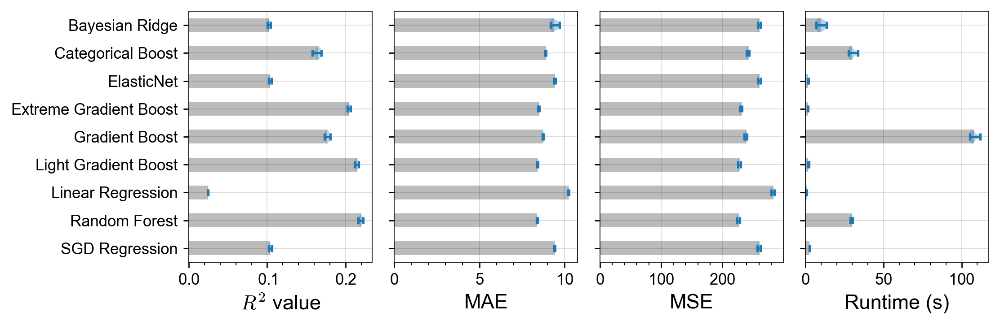

In [175]:
def fig_compare_models(perf=model_perf, size=(9, 3), dpi=150):
    df = perf.sort_values('name', ascending=0)
    cols = [('r2_score', '$R^2$ value', 'dodgerblue'),
            ('mean_absolute_error', 'MAE', 'limegreen'),
            ('mean_squared_error', 'MSE', 'orange'),
            ('runtime', 'Runtime (s)', 'tomato')]
    _, axes = plt.subplots(1, len(cols), figsize=size, dpi=dpi, sharey=True)
    for i, (col, xlab, color) in enumerate(cols):
        ax = pplot(axes[i])
        df.groupby('name')[col].mean().plot.barh(ax=ax, color='#bbb')
        ax.violinplot(df.pivot_table(col, 'seed', 'name'), vert=False,
                      positions=range(df['name'].nunique()))
        ax.tick_params(which='minor', left=False)
        ax.set_xlabel(xlab)
        if i != 0: ax.set_yticklabels([])
        if i == 0: ax.set_yticklabels(df.name.unique())
    ax = axes[0]; ax.set_yticklabels(df.name.unique()); ax.set_ylabel('')
    plt.tight_layout()
    
fig_compare_models(dpi=250)

# 5. SHAP analysis

In [17]:
def get_shap(var, model, top=None, wtd=False,
             test_ratio=0.3, data=data, seed=1234):
    ds = Dataset(var, test_ratio, seed=seed)
    model.fit(ds.Xtrain, ds.ytrain, ds.wtrain if wtd else None)
    explainer = shap.TreeExplainer(model, seed=seed)
    shaps = Pdf(D(feature=ds.X.columns, shap=np.abs(explainer(ds.Xtest).values).mean(0)))
    return shaps

model = lgbm.LGBMRegressor(force_row_wise=True)
shaps = pd.merge(*[get_shap(var, model).rename(columns=D(shap=var.lower())) 
                   for var in ['LogDistance', 'Duration']], on='feature').disp() # t=0:18

[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 517512, number of used features: 23
[LightGBM] [Info] Start training from score 3.697375
[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 517512, number of used features: 23
[LightGBM] [Info] Start training from score 18.606570
23 rows x 3 cols; Memory: 0.0 MiB


,feature,logdistance,duration
,<object>,<float64>,<float64>
0,Mode,0.160676,1.000625


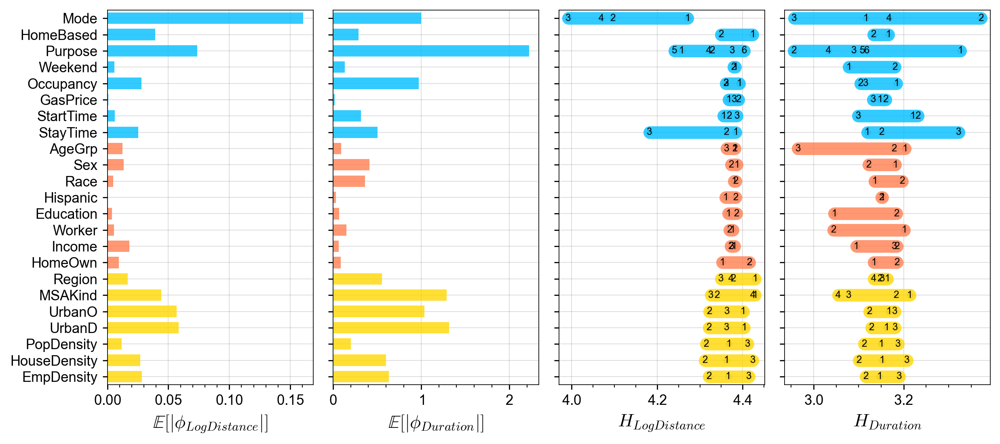

In [104]:
def fig_feature_selection(data, shaps=shaps, size=(10, 4.5), dpi=150):
    _, axes = plt.subplots(1, 4, figsize=size, dpi=dpi, sharey=True)
    # colors = [mpl.colors.to_hex(x) for x in sns.color_palette('Pastel2', 3)]
    colors = ['deepskyblue', 'coral', 'gold']
    shaps = shaps.assign(color=pd.cut(shaps.index, [-INF, 7, 15, INF], labels=colors))
    shaps = shaps.sort_index(ascending=0)
    for i, var in enumerate(['LogDistance', 'Duration']):
        ax = pplot(axes[i], xlab='$\mathbb{E}[|\varphi_{%s}|]$' % var)
        ax.barh(shaps.feature, shaps[var.lower()], color=shaps.color, alpha=0.8, height=0.7)
        ax.set_axisbelow(True)
        ax.grid(color='k', alpha=0.15)
    hist = lambda df: np.histogram(df.val, bins=100, weights=df.TripWeight)[0]
    ent = [] # table containing entropy values
    for var, vmin, vmax in [('LogDistance', 2, 5), ('Duration', 0, 90)]:
        data = data.assign(val=data[var].clip(vmin, vmax))
        for col in data.select_dtypes(CAT).columns:
            for j, (cat, df) in enumerate(data.groupby(col)):
                # y, x = np.histogram(df.val, bins=100, weights=df.TripWeight)
                # value = ((y / y.sum()).cumsum() * x[1:]).sum() / x[1:].sum()
                value = entropy(hist(df))
                ent.append(D(var=var, col=col, cat_id=j, cat=cat, value=value))
    ent = Pdf(ent)
    ent['x'] = len(shaps) - 1 - pd.Categorical(ent.col, categories=shaps.feature).codes
    cols = ent.groupby(['var', 'x', 'col'])['value'].agg(['min', 'max']).reset_index()
    cols['range'] = cols['max'] - cols['min']
    cols = cols.merge(shaps[['feature', 'color']], left_on='col', right_on='feature')
    for i, var in enumerate(['LogDistance', 'Duration']):
        ax = pplot(axes[i + 2], xlab='$H_{%s}$' % var)
        df = ent.query(f'var=="{var}"')
        df = df.assign(x=len(shaps) - 1 - df.x)
        ax.scatter(df.value, df.x, s=15, color='#ccc')
        for _, r in df.iterrows():
            ax.text(r.value, r.x, str(r.cat_id + 1), fontsize=7,
                    color='k', ha='center', va='center')
        for _, r in cols.query(f'var=="{var}"').iterrows():
            ax.add_artist(mpl.lines.Line2D(
                [r['min'], r['max']], [len(shaps) - 1 - r.x] * 2, lw=8.5,
                alpha=0.8, color=r.color, solid_capstyle='round'))
    for i, ax in enumerate(axes):
        ax.set_ylim(-0.5, len(shaps) - 0.5)
        ax.tick_params(which='minor', left=False)
    plt.subplots_adjust(wspace=0.05)
    plt.tight_layout()

x = fig_feature_selection(data, shaps, dpi=250); x

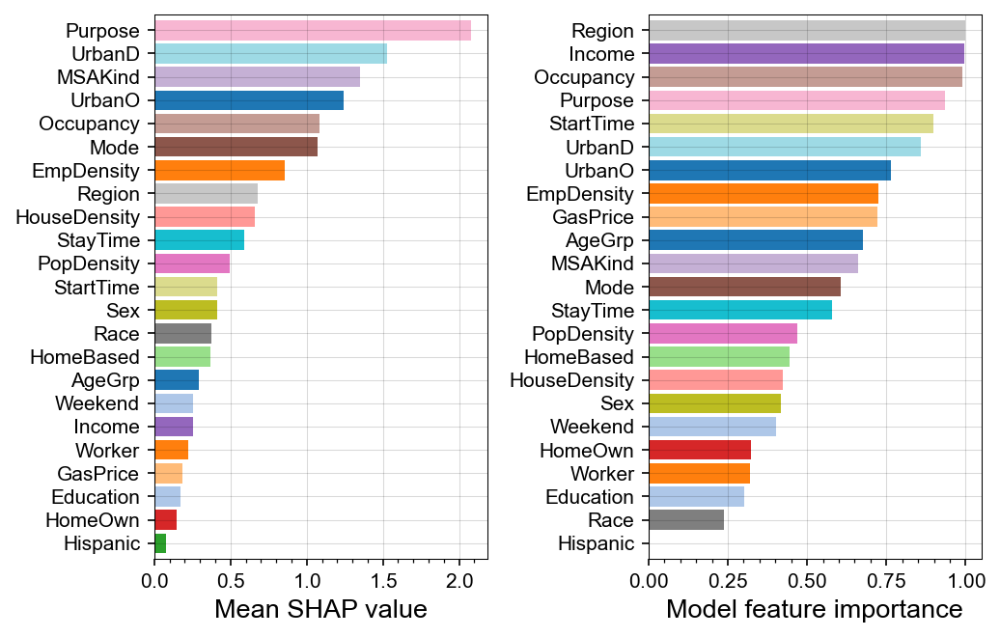

In [ ]:
def plot_shap_importance(shaps, size=(7, 4.5), dpi=150):
    _, axes = plt.subplots(1, 2, figsize=size, dpi=dpi)
    df = shaps.set_index('feature').sort_index()
    df['color'] = [mpl.colors.to_hex(x) for x in sns.color_palette('tab20', len(df))]
    for i, measure, label in [(0, 'shap', 'Mean SHAP value'),
                              (1, 'importance', 'Model feature importance')]:
        df2 = df.sort_values(measure)
        ax = df2[measure].plot.barh(ax=pplot(axes[i]), color=df2.color, width=0.85)
        ax = pplot(ax, ylab='', xlab=label)
        ax.tick_params(which='minor', left=False)
    plt.tight_layout()
    
plot_shap_importance(shap_dur)

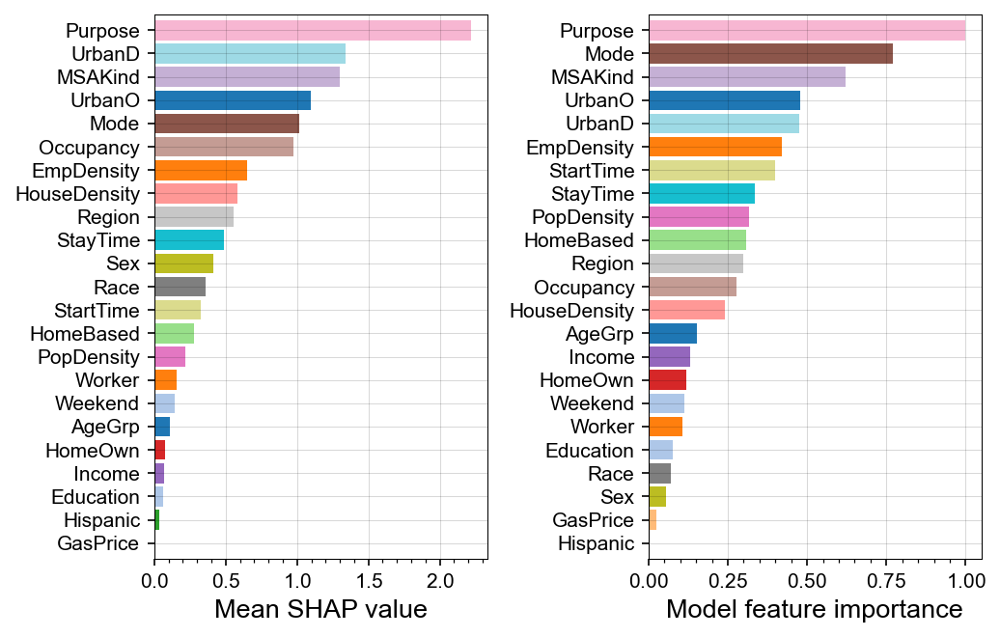

In [ ]:
def plot_shap_importance(shaps, size=(7, 4.5), dpi=150):
    _, axes = plt.subplots(1, 2, figsize=size, dpi=dpi)
    df = shaps.set_index('feature').sort_index()
    df['color'] = [mpl.colors.to_hex(x) for x in sns.color_palette('tab20', len(df))]
    for i, measure, label in [(0, 'shap', 'Mean SHAP value'),
                              (1, 'importance', 'Model feature importance')]:
        df2 = df.sort_values(measure)
        ax = df2[measure].plot.barh(ax=pplot(axes[i]), color=df2.color, width=0.85)
        ax = pplot(ax, ylab='', xlab=label)
        ax.tick_params(which='minor', left=False)
    plt.tight_layout()
    
plot_shap_importance(shap_dur)

[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 516772, number of used features: 23
[LightGBM] [Info] Start training from score 3.697343
23 rows x 3 cols; Memory: 0.0 MiB


,feature,importance,shap
,<object>,<float64>,<float64>
0,Mode,0.813609,0.160503


CPU times: user 6min 52s, sys: 1.08 s, total: 6min 53s
Wall time: 8.47 s


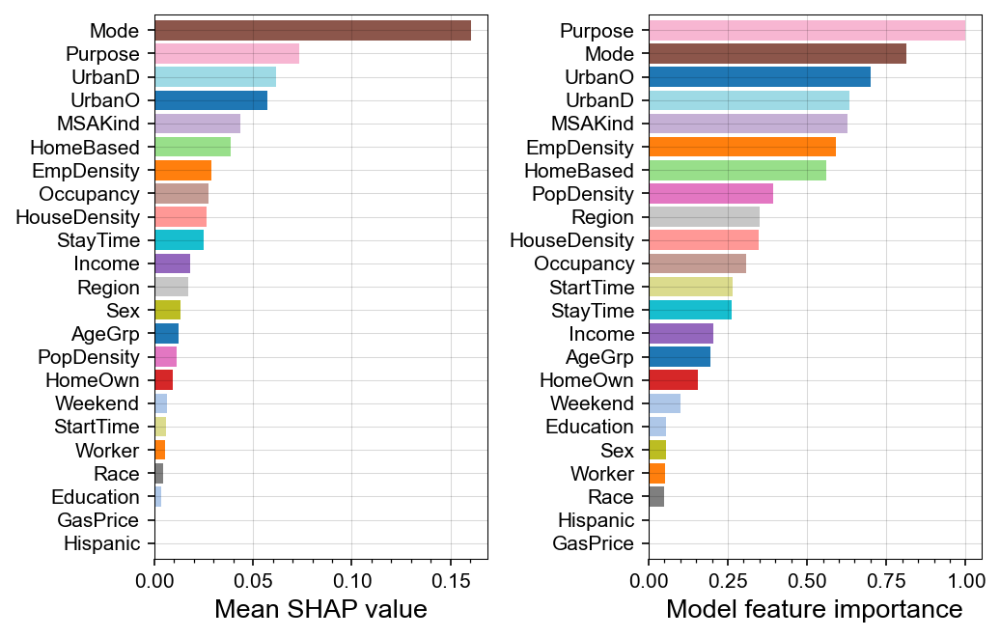

In [ ]:
plot_shap_importance(shap_logd)

In [ ]:
model = lgbm.LGBMRegressor(force_row_wise=True)
shap_speed = get_shap('Speed', model).disp() # t=0:08

[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 516772, number of used features: 23
[LightGBM] [Info] Start training from score 31.381536
23 rows x 3 cols; Memory: 0.0 MiB


,feature,importance,shap
,<object>,<float64>,<float64>
0,Mode,0.510972,4.80932


CPU times: user 7min 14s, sys: 986 ms, total: 7min 15s
Wall time: 8.78 s


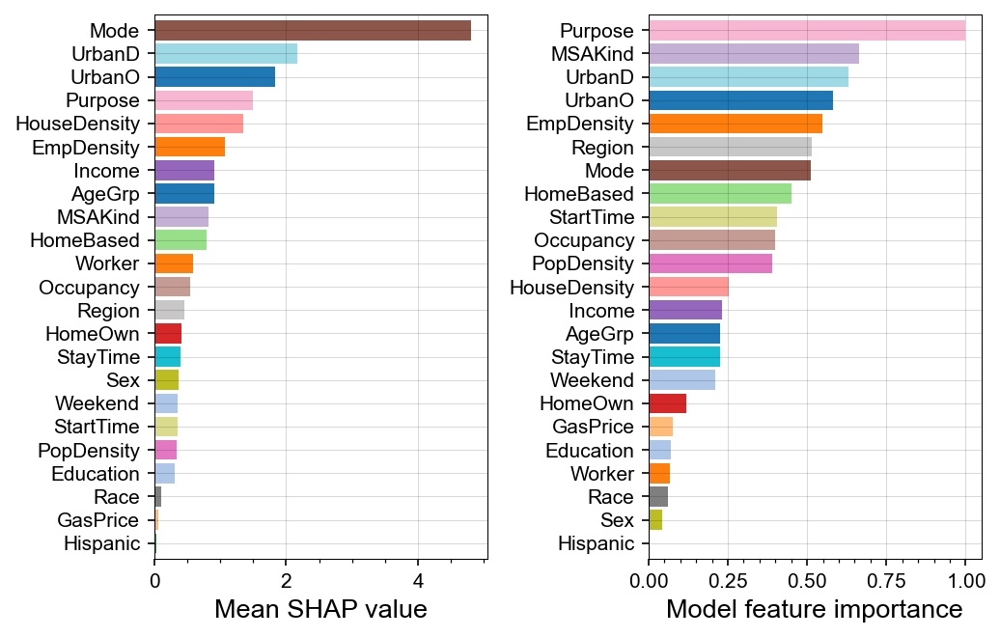

In [ ]:
plot_shap_importance(shap_speed)

In [ ]:
model = lgbm.LGBMRegressor(force_row_wise=True)
shap_dist = get_shap('Distance', model).disp() # t=0:08

[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 516772, number of used features: 23
[LightGBM] [Info] Start training from score 11.350785
23 rows x 3 cols; Memory: 0.0 MiB


,feature,importance,shap
,<object>,<float64>,<float64>
0,Mode,0.476608,1.609412


CPU times: user 7min 40s, sys: 1.12 s, total: 7min 41s
Wall time: 9.09 s


## Long format

### XGBoost

In [ ]:
# n = 10_000
n = None
dsl = Dataset(Xlong.head(n), data['Duration'].head(n), 0.001, 0.3, seed=1234)
model = xgb.XGBRegressor(enable_categorical=True)
ypred = dsl.fit_predict(model)
# model = model.fit(dsl.Xtrain, dsl.ytrain)
# ypred = model.predict(dsl.Xtest)
r2 = skl.metrics.r2_score(dsl.ytest, ypred); r2

0.20617527066724894

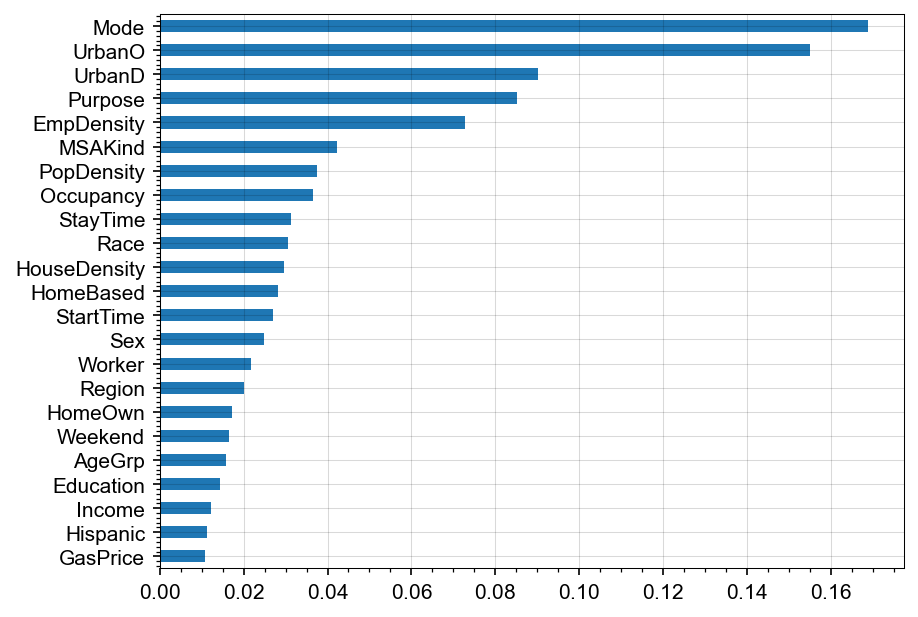

In [ ]:
Series(model.feature_importances_, index=Xlong.columns).sort_values().plot.barh();

In [ ]:
%time shaps = model.get_booster().predict(xgb.DMatrix(dsl.Xtest, enable_categorical=True), pred_contribs=True); shaps.shape

CPU times: user 16min 36s, sys: 165 ms, total: 16min 36s
Wall time: 14.2 s


(295722, 24)

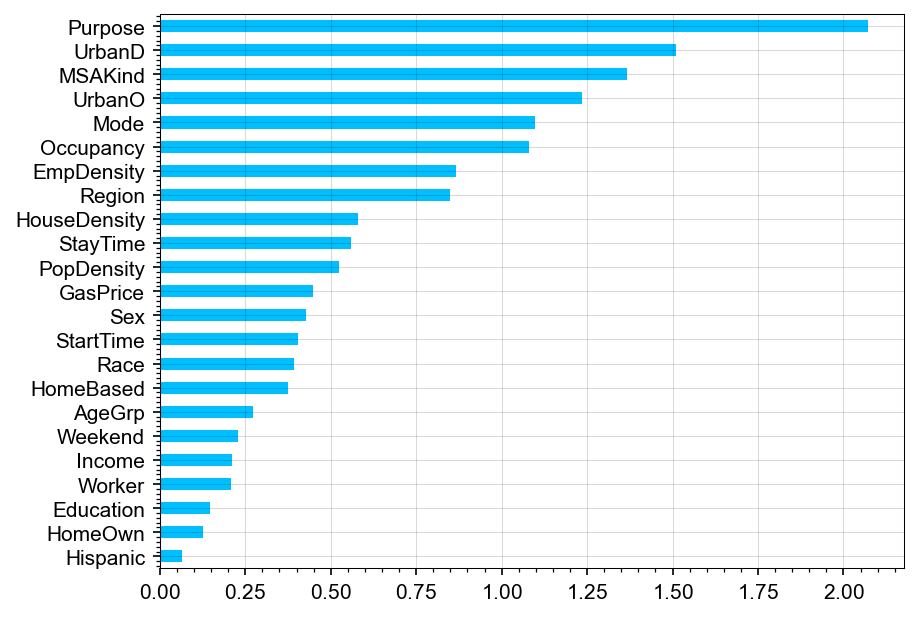

In [ ]:
Series(np.abs(shaps[:, :-1]).mean(0), index=Xlong.columns).sort_values().plot.barh(color='deepskyblue');

In [ ]:
# n = 10_000
n = None
dsl = Dataset(Xlong.head(n), data['LogDistance'].head(n), 0.01, 0.4, seed=9427)
model = xgb.XGBRegressor(enable_categorical=True)
ypred = dsl.fit_predict(model)
# model = model.fit(dsl.Xtrain, dsl.ytrain)
# ypred = model.predict(dsl.Xtest)
r2 = skl.metrics.r2_score(dsl.ytest, ypred); r2

0.44732536840781734

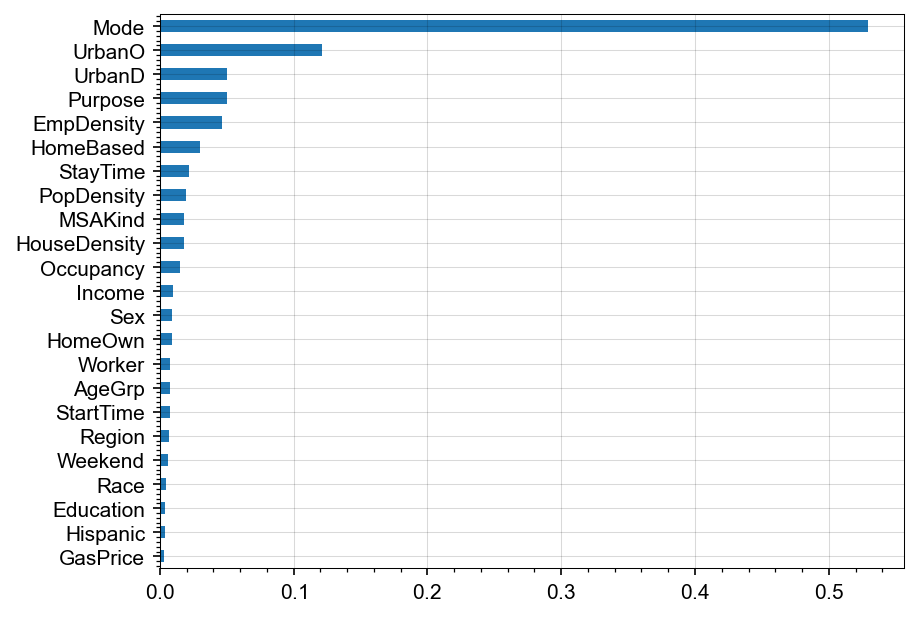

In [ ]:
Series(model.feature_importances_, index=Xlong.columns).sort_values().plot.barh();

In [ ]:
%time shaps = model.get_booster().predict(xgb.DMatrix(dsl.Xtest, enable_categorical=True), pred_contribs=True); shaps.shape

CPU times: user 16min 29s, sys: 182 ms, total: 16min 29s
Wall time: 14.1 s


(295722, 24)

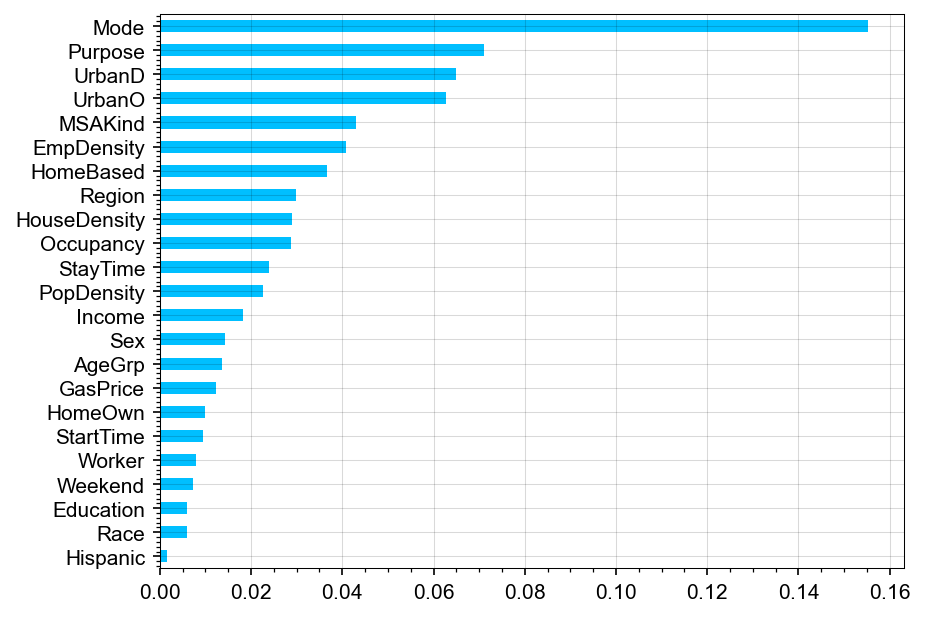

In [ ]:
Series(np.abs(shaps[:, :-1]).mean(0), index=Xlong.columns).sort_values().plot.barh(color='deepskyblue');

### LightGBM

In [ ]:
model = lgbm.LGBMRegressor(force_row_wise=True)
model.fit(dsl.Xtrain, dsl.ytrain)
ypred = model.predict(dsl.Xtest)
r2 = skl.metrics.r2_score(dsl.ytest, ypred); r2

[LightGBM] [Info] Total Bins 79
[LightGBM] [Info] Number of data points in the train set: 436188, number of used features: 23
[LightGBM] [Info] Start training from score 3.697544


0.4344011382560068

In [ ]:
%%time
explainer = shap.TreeExplainer(model, seed=12)
shap_values = explainer(dsl.Xtest)

CPU times: user 8min 41s, sys: 668 ms, total: 8min 41s
Wall time: 10.6 s


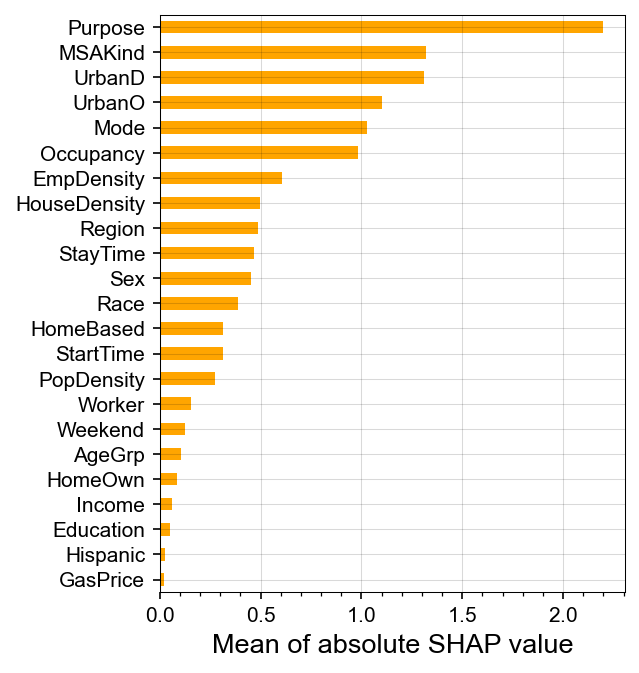

In [ ]:
ax = pplot(size=(4, 5), dpi=150)
ax.tick_params(which='minor', left=False)
Series(np.abs(shap_values.values).mean(0), index=Xlong.columns).sort_values().plot.barh(
    ax=ax, color='orange')
ax.set_xlabel('Mean of absolute SHAP value');

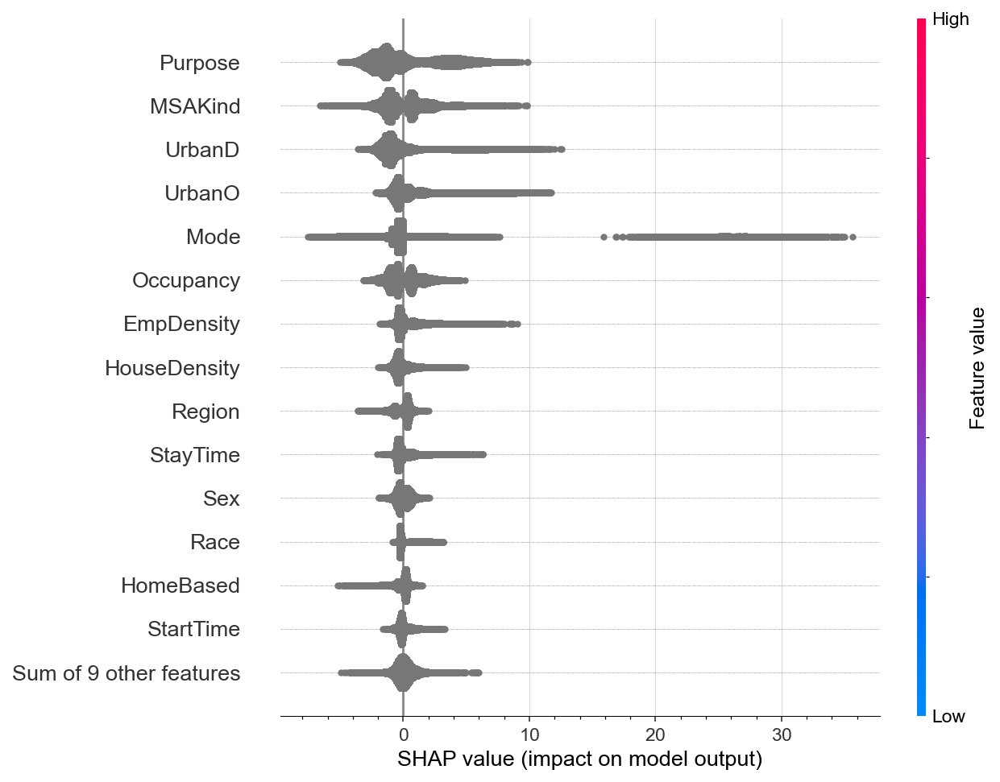

In [ ]:
shap.plots.beeswarm(shap_values, 15)

In [ ]:
# ax = shap.plots.bar(shap_values, 60, show=False)
# ax = pplot(ax, size=(5, 8), dpi=150)

## Wide format

In [ ]:
# n = 100_000
n = None
ds = Dataset(Xwide.head(n), data['Duration'].head(n), 0.01, 0.3, seed=25)
model = xgb.XGBRegressor()
model = model.fit(ds.Xtrain, ds.ytrain)
ypred = model.predict(ds.Xtest)
r2 = skl.metrics.r2_score(ds.ytest, ypred); r2

0.20522384242984248

In [ ]:
%%time
explainer = shap.TreeExplainer(model, seed=1234)
shap_values = explainer(ds.Xtest)

/home/umni2/a/umnilab/users/verma99/anaconda3/envs/mk11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning:

[09:48:39] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.



CPU times: user 12min 20s, sys: 338 ms, total: 12min 21s
Wall time: 10.8 s


/home/umni2/a/umnilab/users/verma99/anaconda3/envs/mk11/lib/python3.11/site-packages/matplotlib/ticker.py:2937: RuntimeWarning:

invalid value encountered in log10



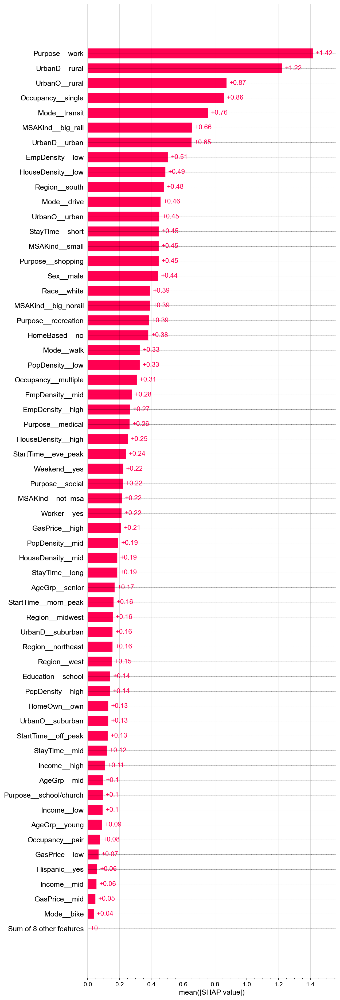

In [ ]:
shap.plots.bar(shap_values, 60)

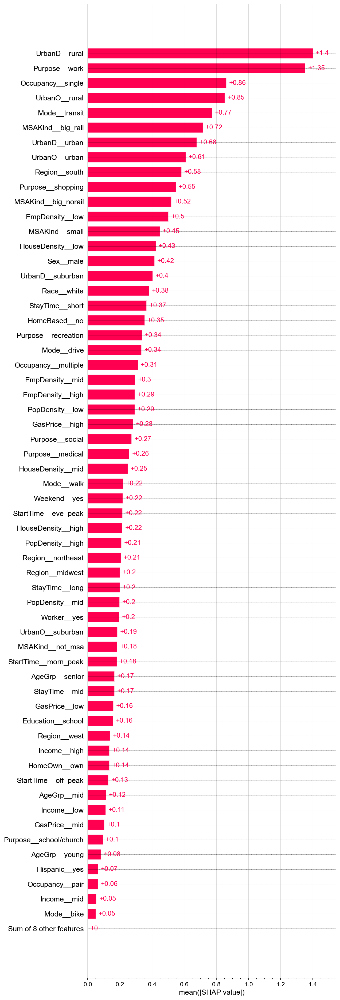

In [ ]:
shap.plots.bar(shap_values, 60)

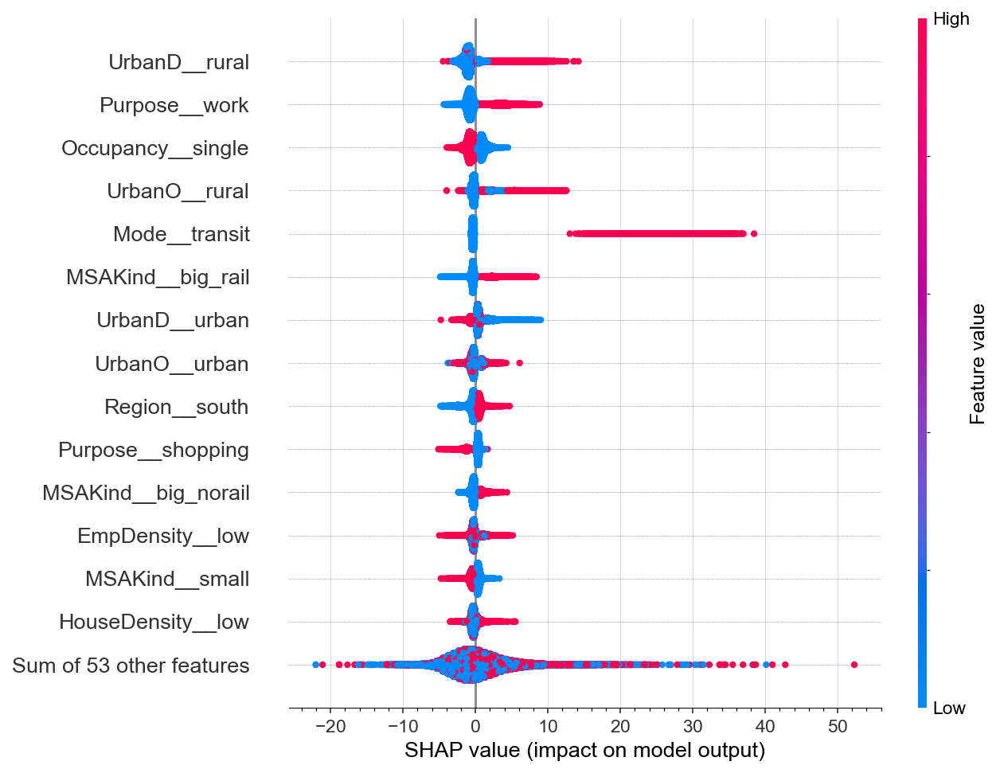

In [ ]:
shap.plots.beeswarm(shap_values, 15)

In [ ]:
meansAll = Series(np.vstack([x.values for x in shap_values]).mean(0), index=Xwide.columns).disp(3)

67 rows; Memory: 0.0 MiB
Mode__drive      0.026496
Mode__transit    0.009979
Mode__walk      -0.003377
dtype: float32


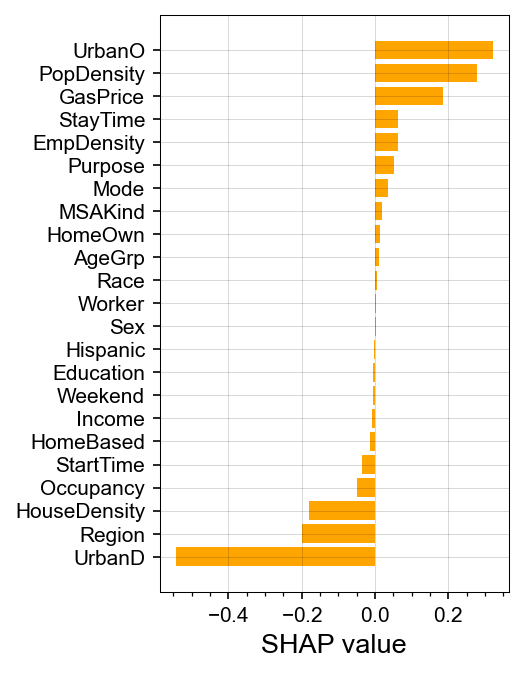

In [ ]:
meansCol = (meansAll.rename('shap').reset_index()
            .assign(col=lambda df: df['index'].str.split('__').str[0])
            .groupby('col')['shap'].sum().sort_values())
ax = pplot(size=(3, 5), dpi=150, xlab='SHAP value')
ax.tick_params(which='minor', left=False)
ax.barh(meansCol.index, meansCol.values, color='orange');

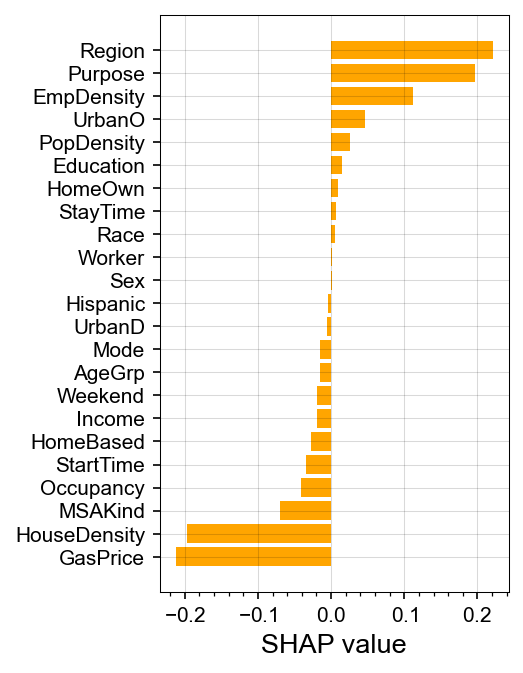

In [ ]:
meansCol = (meansAll.rename('shap').reset_index()
            .assign(col=lambda df: df['index'].str.split('__').str[0])
            .groupby('col')['shap'].sum().sort_values())
ax = pplot(size=(3, 5), dpi=150, xlab='SHAP value')
ax.tick_params(which='minor', left=False)
ax.barh(meansCol.index, meansCol.values, color='orange');

In [28]:
len(shap_values)

30000

In [24]:
shap_values[1]

.values =
array([-0.27000567, -0.44941896,  0.1591193 , -0.00667062, -0.11172851,
        0.        , -1.0573285 , -1.0811725 , -0.14220428, -0.12963066,
       -0.15874787,  0.01336072,  0.02413839,  0.        , -0.82619655,
       -0.0331588 , -0.01703089, -0.03107108,  0.12795931,  0.01550202,
        0.16196865, -0.33782533, -0.17572515, -0.542538  , -0.15594558,
       -0.0444697 ,  0.11028564,  0.18112148,  0.09363361, -0.1797787 ,
        0.        , -0.3669727 ,  0.        , -0.02627253,  0.        ,
       -0.58862305,  0.        , -0.20345369,  0.        , -0.13272512,
        0.04643644, -0.15279186, -0.07057894,  0.        ,  0.15913486,
        0.08685303,  0.3611551 , -0.13128328, -0.53838605,  0.49360055,
        0.37777033, -0.08415854, -0.19908032, -0.37367743, -0.7679725 ,
       -0.80299383, -0.05331295, -0.8394219 , -0.08985316,  0.70132184,
        0.04645156, -0.8566541 , -0.33834952,  0.06117739, -0.22171366,
        0.538924  ,  1.4193412 ], dtype=float32)

.bas

In [83]:
shap.plots.waterfall(shap_values[1], show=False)

Locator attempting to generate 4502793821 ticks ([9.889439595962628, ..., 18.89502798108829]), which exceeds Locator.MAXTICKS (1000).


In [14]:
X = pd.get_dummies(data.select_dtypes(CAT), prefix_sep='__').disp(0)

757,498 rows x 67 cols; Memory: 54.2 MiB


,Mode__drive,Mode__transit,Mode__walk,Mode__bike,HomeBased__no,HomeBased__yes,Purpose__work,Purpose__shopping,Purpose__social,Purpose__school/church,...,UrbanD__rural,PopDensity__low,PopDensity__mid,PopDensity__high,HouseDensity__low,HouseDensity__mid,HouseDensity__high,EmpDensity__low,EmpDensity__mid,EmpDensity__high
,<bool>,<bool>,<bool>,<bool>,<bool>,<bool>,<bool>,<bool>,<bool>,<bool>,...,<bool>,<bool>,<bool>,<bool>,<bool>,<bool>,<bool>,<bool>,<bool>,<bool>


In [15]:
tree_dist = skl.tree.DecisionTreeRegressor(random_state=1234).fit(X, data['distance'])

In [16]:
tree_time = skl.tree.DecisionTreeRegressor(random_state=1234).fit(X, data['duration'])

NameError: name 'skl' is not defined

In [ ]:
skl.metrics.r2_score(data.duration, tree_time.predict(X))

AttributeError: module 'sklearn' has no attribute 'metrics'

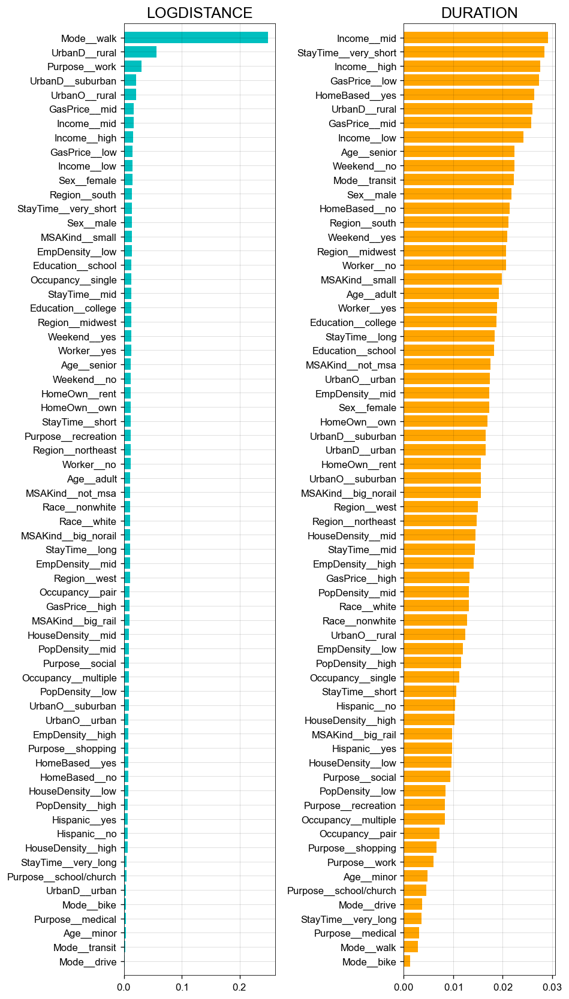

In [ ]:
def plot_feature_imp(data, size=(8, 14), dpi=100, seed=1234, drop_first=False):
    _, axes = plt.subplots(1, 2, figsize=size, dpi=dpi)
    X = pd.get_dummies(data.select_dtypes(CAT), prefix_sep='__', drop_first=drop_first)
    for ax, (var, color) in zip(axes, [('logdistance', 'c'), ('duration', 'orange')]):
        ax = pplot(ax, title=var.upper(), ylim=(-1, X.columns.size))
        ax.set_title(var.upper())
        tree = skl.tree.DecisionTreeRegressor(random_state=seed).fit(X, data[var])
        imp = Series(tree.feature_importances_, index=X.columns).sort_values()
        ax.barh(imp.index, imp, color=color)
        ax.minorticks_off()
    plt.tight_layout()

plot_feature_imp(data, dpi=120) # t=0:24

In [ ]:
tree = DecisionTreeRegressor(random_state=1234, max_depth=8).fit(X, data.duration)

AttributeError: module 'sklearn' has no attribute 'tree'

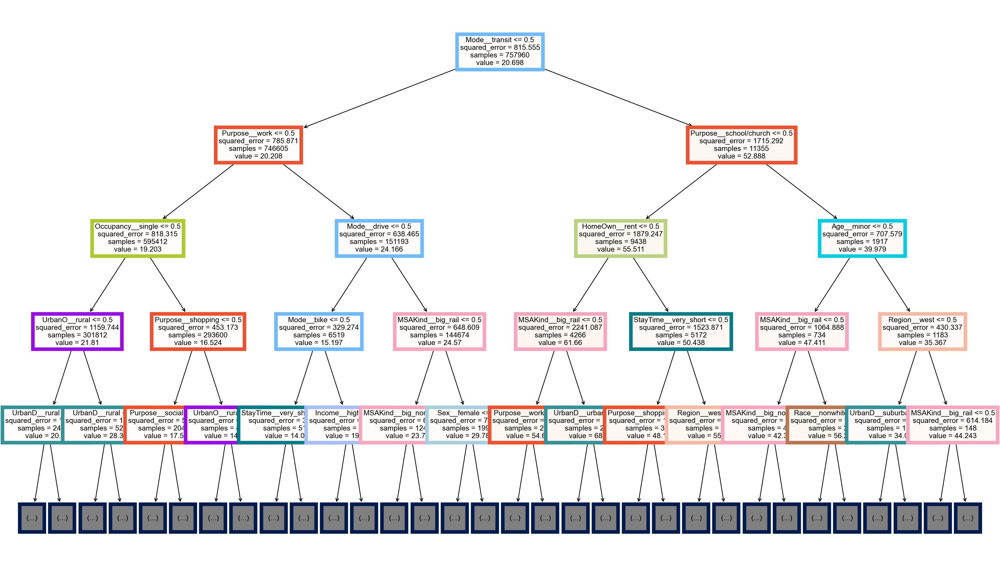

In [ ]:
ax = pplot(size=(24, 14), dpi=150)
np.random.seed(12345)
artists = skl.tree.plot_tree(tree, max_depth=4, feature_names=list(X.columns),
                    ax=ax, filled=True, impurity=True, fontsize=10)
features = {x._text.split('__')[0] for x in artists}
colors = dict(zip(features, sns.color_palette(np.random.random((len(features), 3)))))
for i, artist in enumerate(artists):
    artist.get_bbox_patch().set_edgecolor(colors[artist._text.split('__')[0]])
    artist.get_bbox_patch().set_linewidth(5)

# 7. SES

In [ ]:
# ses_cols = pd.get_dummies(trips[feature_grps.query('group=="SES"').feature], prefix_sep='__').columns
ses_feats = ('AgeGrp', 'Race', 'Sex', 'HomeOwn', 'Income')

In [ ]:
def get_distr_auc(target, feats=ses_feats, trips=trips, models=models):
    X, y = pd.get_dummies(trips[list(feats)], prefix_sep='__'), trips[target]
    # X, y = trips[list(feats)], trips[target]
    # cats = X.apply(lambda x: list(x.cat.categories))
    # return cats
    # return list(it.product(*[[f'{k}__{z}' for z in v] for k, v in cats.items()]))
    # n_combs = np.prod(cats.apply(len))
    # for col in X.columns:
    #     return X[col].cat.categories
    # LGBMRegressor(n_jobs=-1, )
    model = models[target].fit(X, y)
    r2 = r2_score(y, model.predict(X))
    print(f'R2 value: {r2:.3f}')
    return model

x = get_distr_auc('Duration'); x

R2 value: 0.007


LGBMRegressor(force_row_wise=True, learning_rate=0.05, n_jobs=-1, verbosity=0)

In [ ]:
x.predict()

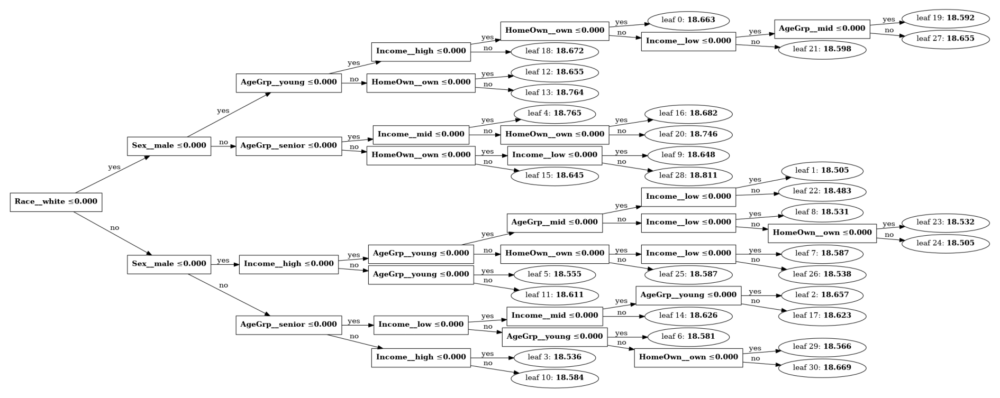

In [ ]:
ax = pplot(size=(16, 8), dpi=150)
plot_tree(x, ax=ax);

In [ ]:
def get_ses_shap(target, shaps=shap_level, trips=trips, groups=feature_grps):
    features = groups.query(f'group=="SES"').feature
    cols = pd.get_dummies(trips[features], prefix_sep='__').columns
    sh = shaps.query(f'target=="{target}"').set_index('row_id')[cols]
    return sh

sh_ses = get_ses_shap('Duration').disp()
x = get_ses_shap('Duration'); x

,AgeGrp__young,AgeGrp__mid,AgeGrp__senior,Sex__male,Sex__female,Race__white,Race__nonwhite,Hispanic__yes,Hispanic__no,Education__school,Education__college,Worker__yes,Worker__no,Income__low,Income__mid,Income__high,HomeOwn__own,HomeOwn__rent
row_id,,,,,,,,,,,,,,,,,,
0,0.000054,-0.000306,0.000467,-0.002458,-0.000242,0.012877,0.000329,-0.000034,0.0,-0.000011,0.0,0.000308,0.000163,0.000045,1.513799e-06,-0.000182,0.000099,0.0
1,0.000056,-0.000298,0.000469,-0.002797,-0.000228,0.013004,0.000116,-0.000032,0.0,-0.000017,0.0,0.000328,0.000037,0.000046,9.874270e-07,-0.000195,0.000095,0.0
2,0.000078,-0.001278,0.000373,0.003155,0.000355,0.010993,0.001002,-0.000034,0.0,-0.000011,0.0,-0.000385,-0.000010,0.000153,1.424794e-06,-0.000475,0.000166,0.0
3,-0.000316,-0.000299,-0.000137,-0.002354,-0.000248,0.012268,0.000329,-0.000033,0.0,0.000041,0.0,0.000379,0.000033,0.000045,1.424794e-06,-0.000168,0.000097,0.0
4,-0.000218,-0.000298,-0.000152,-0.002853,-0.000239,0.013225,0.000116,-0.000032,0.0,0.000044,0.0,0.000313,0.000037,0.000046,9.874270e-07,-0.000174,0.000093,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
738828,0.000190,0.000459,-0.000160,0.002788,0.000188,-0.002034,-0.000078,-0.000126,0.0,-0.000019,0.0,-0.003876,-0.000044,0.000286,-3.561675e-06,-0.000391,0.001027,0.0
738829,0.000120,0.000175,-0.000131,0.003135,0.000320,-0.002181,-0.000074,-0.000120,0.0,-0.000011,0.0,-0.002687,-0.000054,0.000045,-3.846288e-06,0.000193,0.000676,0.0
738830,0.000120,0.000175,-0.000134,0.002493,0.000320,-0.002177,-0.000074,-0.000120,0.0,-0.000011,0.0,-0.003205,-0.000328,0.000047,-3.846288e-06,0.000194,0.000723,0.0


In [ ]:
pca = skl.decomposition.PCA(2).fit(sh_ses)
df = Pdf(pca.transform(sh_ses), columns=['pc1', 'pc2']).disp()

738,833 rows x 2 cols; Memory: 5.6 MiB


,pc1,pc2
,<float32>,<float32>
0,0.013188,-0.002287


In [ ]:
pca.components_

array([[-2.1041618e-03,  4.6860417e-03, -7.6738778e-03, -1.2599149e-02,
        -1.3798632e-03,  9.9980694e-01, -0.0000000e+00, -1.7937562e-04,
        -0.0000000e+00,  3.9250223e-04, -0.0000000e+00,  2.3808966e-03,
        -3.2428397e-05, -1.9538722e-03, -3.4852706e-05, -2.5101330e-03,
        -1.1144590e-02, -0.0000000e+00],
       [ 2.8749573e-04,  3.2572460e-04,  8.7974817e-03,  9.9784815e-01,
         6.2689632e-02,  1.2799512e-02, -0.0000000e+00, -1.4261066e-04,
        -0.0000000e+00,  4.1026797e-04, -0.0000000e+00, -7.1048704e-03,
        -7.6508080e-04,  5.3474070e-03,  3.4004738e-06,  6.4008939e-03,
         2.5727737e-03, -0.0000000e+00]], dtype=float32)

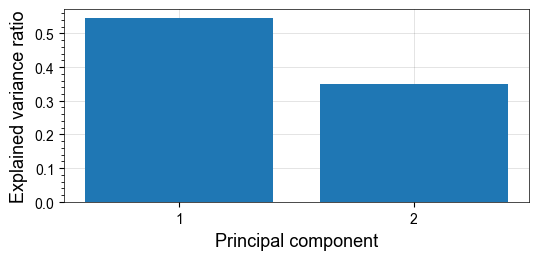

In [ ]:
ax = pplot(size=(5, 5), dpi=100)
ax.pie(pca.explained_variance_ratio_, autopct='%.1f');

In [ ]:
comp = Pdf(pca.components_, index=['pc1', 'pc2'], columns=sh_ses.columns).disp(None)

2 rows x 18 cols; Memory: 0.0 MiB


col,AgeGrp__young,AgeGrp__mid,AgeGrp__senior,Sex__male,Sex__female,Race__white,Race__nonwhite,Hispanic__yes,Hispanic__no,Education__school,Education__college,Worker__yes,Worker__no,Income__low,Income__mid,Income__high,HomeOwn__own,HomeOwn__rent
,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>
pc1,-0.002104,0.004686,-0.007674,-0.012599,-0.00138,0.999807,-0.0,-0.000179,-0.0,0.000393,-0.0,0.002381,-0.000032,-0.001954,-0.000035,-0.00251,-0.011145,-0.0
pc2,0.000287,0.000326,0.008797,0.997848,0.06269,0.0128,-0.0,-0.000143,-0.0,0.00041,-0.0,-0.007105,-0.000765,0.005347,0.000003,0.006401,0.002573,-0.0


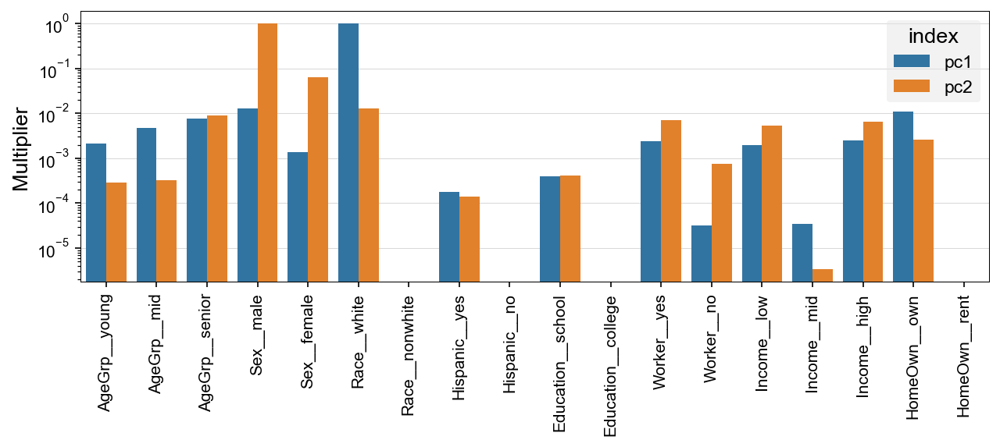

In [ ]:
ax = pplot(size=(10, 3), dpi=150, ylog=1, xminor=0)
sns.barplot(np.abs(comp).reset_index().melt('index'), ax=ax, x='col', y='value', hue='index')
plt.xticks(rotation=90); ax.set_xlabel(''); ax.set_ylabel('Multiplier');

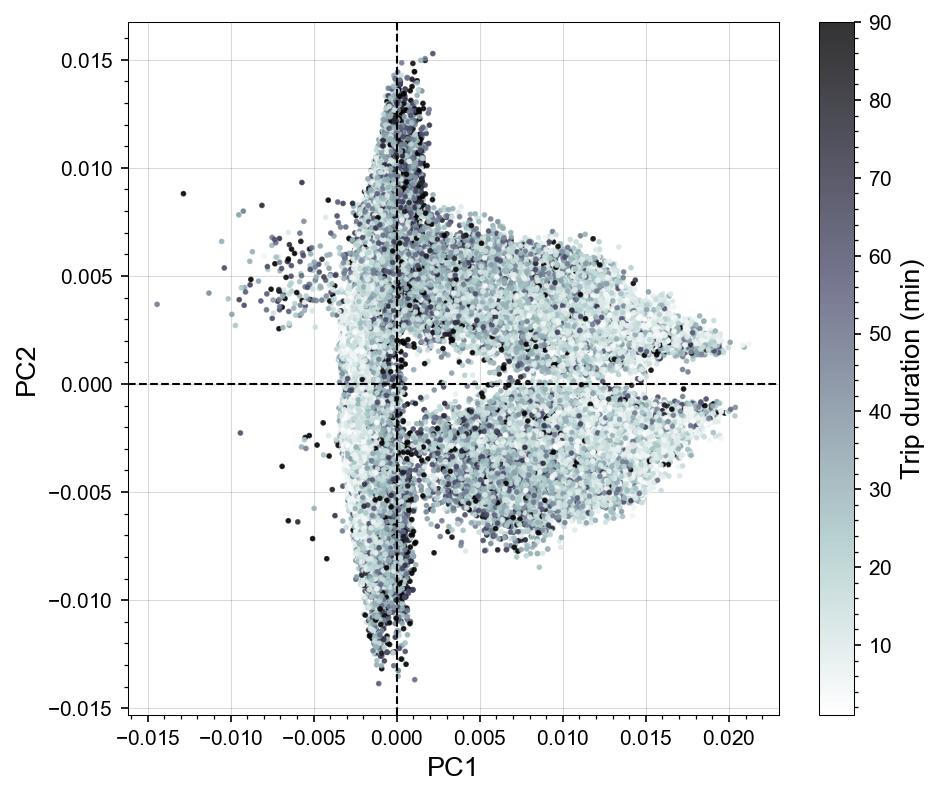

In [ ]:
ax = pplot(size=(7, 6), dpi=150, xlab='PC1', ylab='PC2')
im = ax.scatter(df.pc1, df.pc2, c=trips.Duration.clip(0, 90), cmap='bone_r', s=3, alpha=0.8)
plt.gcf().colorbar(im, ax=ax, label='Trip duration (min)')
for f in [ax.axvline, ax.axhline]: f(0, color='k', ls='--', lw=1)

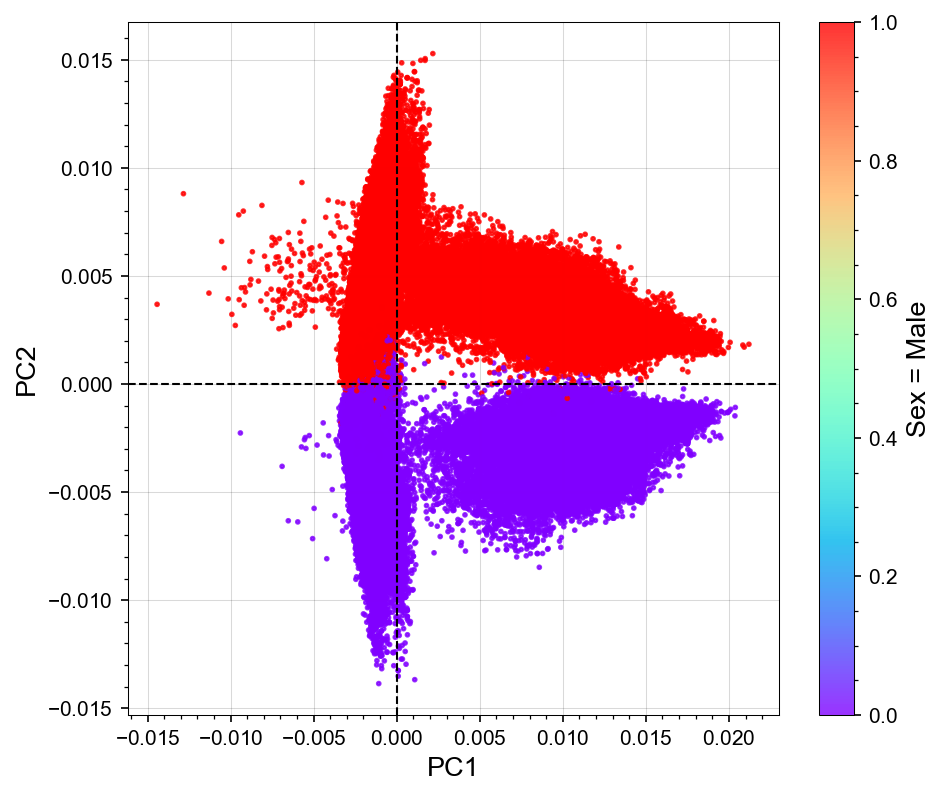

In [ ]:
ax = pplot(size=(7, 6), dpi=150, xlab='PC1', ylab='PC2')
im = ax.scatter(df.pc1, df.pc2, c=trips.Sex == 'male', cmap='rainbow', s=3, alpha=0.8)
plt.gcf().colorbar(im, ax=ax, label='Sex = Male')
for f in [ax.axvline, ax.axhline]: f(0, color='k', ls='--', lw=1)

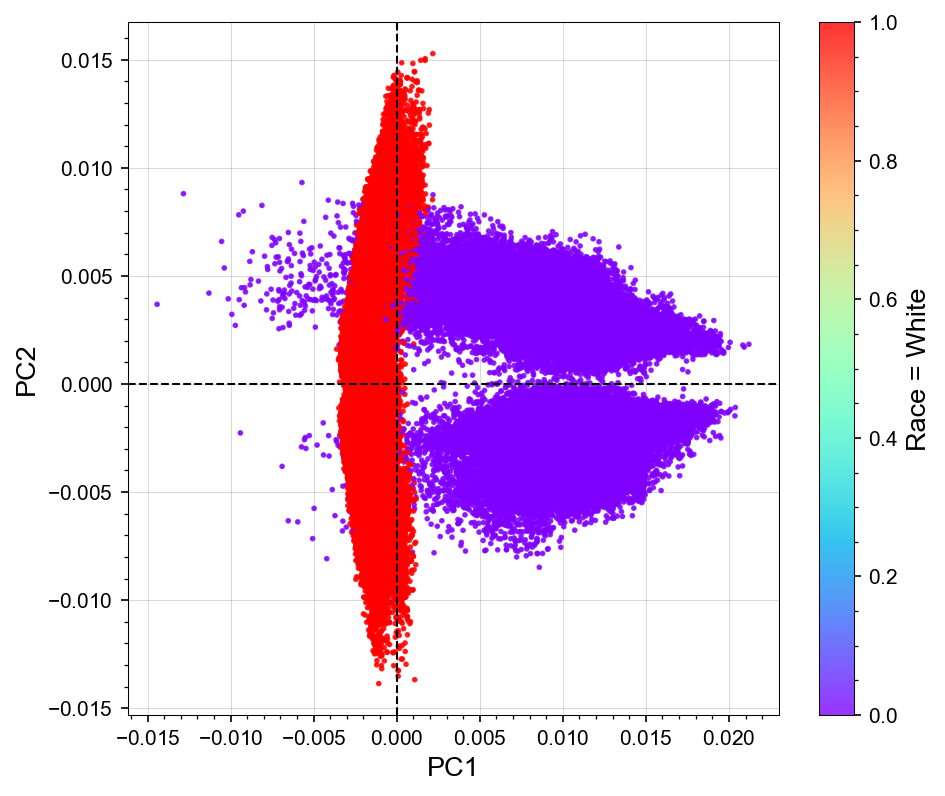

In [ ]:
ax = pplot(size=(7, 6), dpi=150, xlab='PC1', ylab='PC2')
im = ax.scatter(df.pc1, df.pc2, c=trips.Race == 'white', cmap='rainbow', s=3, alpha=0.8)
plt.gcf().colorbar(im, ax=ax, label='Race = White')
for f in [ax.axvline, ax.axhline]: f(0, color='k', ls='--', lw=1)

In [ ]:
def get_ses_shap(target, shaps=shap_level, trips=trips, groups=feature_grps):
    sh = shaps.query(f'target=="{target}"')
    sh = sh.assign(feature=sh.col.map(lambda x: x.split('__')[0]))
    sh = sh.merge(groups.query('group=="SES"')['feature'])
    sh = sh.pivot_table('shap', 'row_id', 'col')
    return sh

sh_ses = get_ses_shap('LogDistance').disp()

738,833 rows x 18 cols; Memory: 53.6 MiB


col,AgeGrp__young,AgeGrp__mid,AgeGrp__senior,Sex__male,Sex__female,Race__white,Race__nonwhite,Hispanic__yes,Hispanic__no,Education__school,Education__college,Worker__yes,Worker__no,Income__low,Income__mid,Income__high,HomeOwn__own,HomeOwn__rent
row_id,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>
0,-0.002361,-0.000157,-0.012516,-0.003841,-0.000363,0.005457,0.000217,0.000012,0.0,0.001441,0.000076,-0.000777,-0.000038,0.004981,0.000008,-0.003121,0.002465,0.000147


In [ ]:
pca = skl.decomposition.PCA(18).fit(sh_ses)
df = Pdf(pca.transform(sh_ses)).disp()

738,833 rows x 18 cols; Memory: 50.7 MiB


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>
0,-0.001413,0.013037,-0.002274,0.005578,-0.003239,-0.002157,0.005698,-0.001128,-0.000719,-0.000085,0.000025,0.000176,0.000008,-0.000009,0.0,-0.000133,0.000012,-0.0


In [ ]:
pca.components_

array([[ 6.38036197e-03, -7.83058535e-03, -2.12070614e-01,
        -6.01744689e-02, -8.94720852e-03,  2.37707794e-02,
         1.14594412e-03, -8.89745075e-04, -1.08420217e-19,
        -5.14638163e-02, -2.69357720e-03, -5.54345883e-02,
        -2.73241685e-03, -8.98955107e-01, -6.76974014e-04,
        -2.56936640e-01, -2.65473276e-01, -1.75056588e-02],
       [-1.18848659e-01, -1.80250369e-02, -8.95536005e-01,
         3.11953649e-02,  4.98275133e-03, -4.69665229e-02,
        -2.62308796e-03,  2.44124816e-03, -1.11022302e-16,
         7.25144800e-03,  1.85248151e-04, -1.13588683e-01,
        -6.29708031e-03,  1.03050254e-01,  2.40254012e-04,
        -2.18320712e-02,  3.94454718e-01,  2.57727075e-02]], dtype=float32)

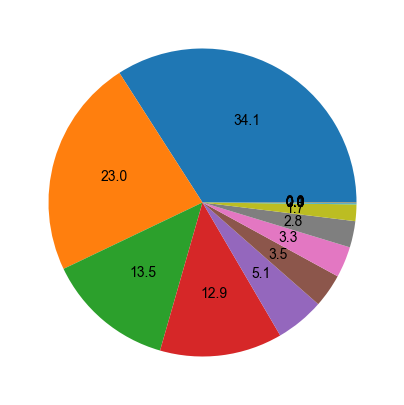

In [ ]:
ax = pplot(size=(5, 5), dpi=100)
ax.pie(pca.explained_variance_ratio_, autopct='%.1f');

In [ ]:
comp = Pdf(pca.components_, index=['pc1', 'pc2'], columns=sh_ses.columns).disp(None)

2 rows x 18 cols; Memory: 0.0 MiB


col,AgeGrp__young,AgeGrp__mid,AgeGrp__senior,Sex__male,Sex__female,Race__white,Race__nonwhite,Hispanic__yes,Hispanic__no,Education__school,Education__college,Worker__yes,Worker__no,Income__low,Income__mid,Income__high,HomeOwn__own,HomeOwn__rent
,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>,<float32>
pc1,0.00638,-0.007831,-0.212071,-0.060174,-0.008947,0.023771,0.001146,-0.00089,-0.0,-0.051464,-0.002694,-0.055435,-0.002732,-0.898955,-0.000677,-0.256937,-0.265473,-0.017506
pc2,-0.118849,-0.018025,-0.895536,0.031195,0.004983,-0.046967,-0.002623,0.002441,-0.0,0.007251,0.000185,-0.113589,-0.006297,0.10305,0.00024,-0.021832,0.394455,0.025773


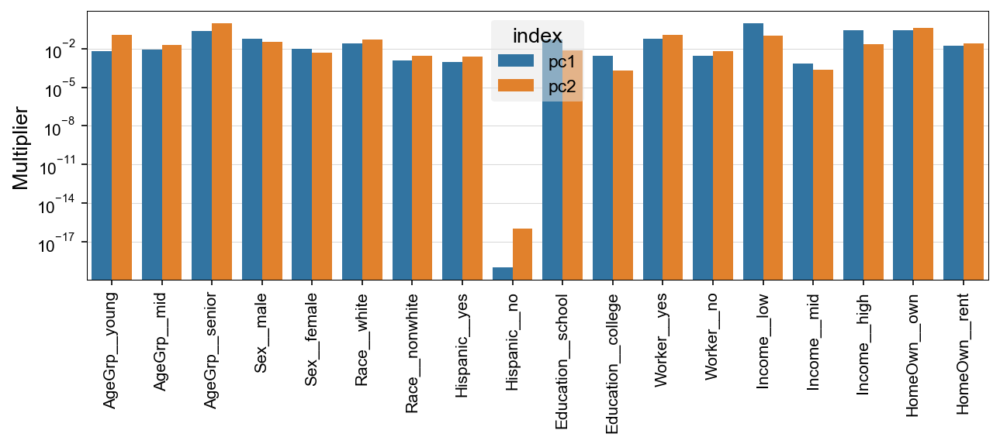

In [ ]:
ax = pplot(size=(10, 3), dpi=150, ylog=1, xminor=0)
sns.barplot(np.abs(comp).reset_index().melt('index'), ax=ax, x='col', y='value', hue='index')
plt.xticks(rotation=90); ax.set_xlabel(''); ax.set_ylabel('Multiplier');

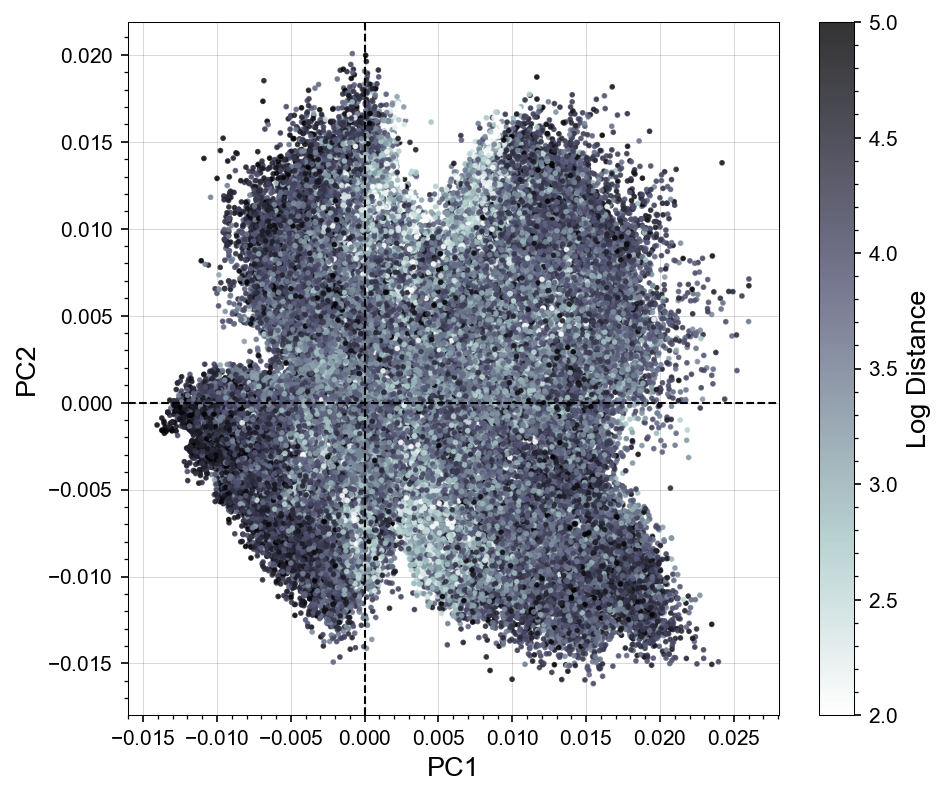

In [ ]:
ax = pplot(size=(7, 6), dpi=150, xlab='PC1', ylab='PC2')
im = ax.scatter(df.pc1, df.pc2, c=trips.LogDistance.clip(2, 5), cmap='bone_r', s=3, alpha=0.8)
plt.gcf().colorbar(im, ax=ax, label='Log Distance')
for f in [ax.axvline, ax.axhline]: f(0, color='k', ls='--', lw=1)

In [ ]:
kmeans = skl.cluster.KMeans(3).fit_transform(df)
kmeans

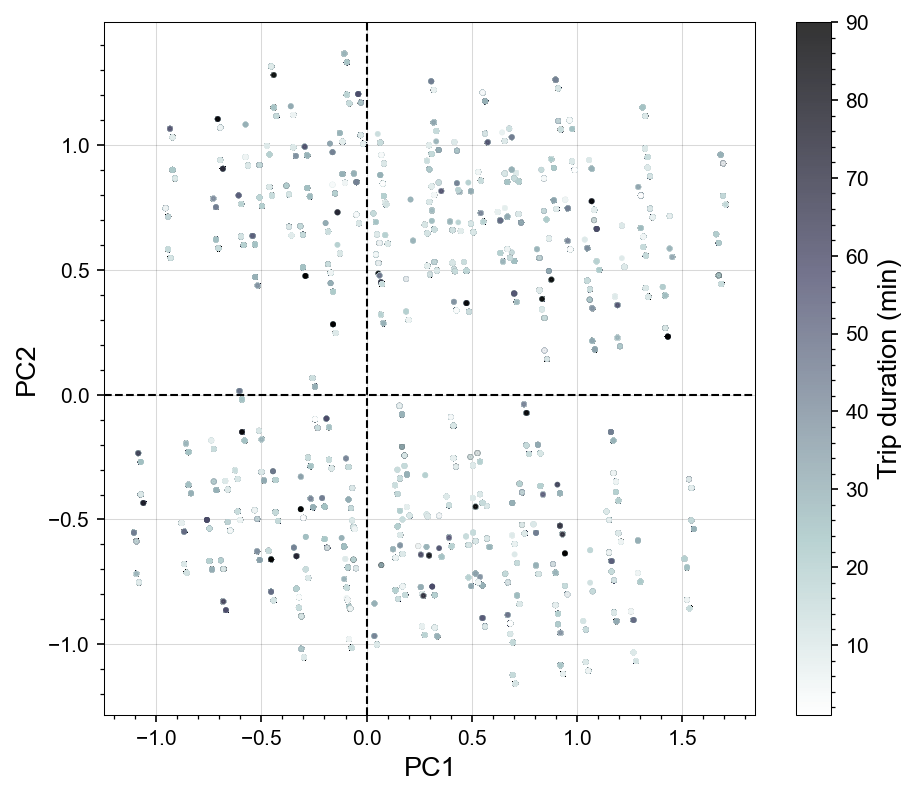

In [ ]:
pca = skl.decomposition.PCA(18)
df2 = pd.get_dummies(trips.loc[:, 'AgeGrp': 'HomeOwn'])
df2 = Pdf(pca.fit_transform(df2)[:, :2], columns=['pc1', 'pc2'])
ax = pplot(size=(7, 6), dpi=150, xlab='PC1', ylab='PC2')
im = ax.scatter(df2.pc1, df2.pc2, c=trips.Duration.values.clip(0, 90), cmap='bone_r', s=3, alpha=0.8)
plt.gcf().colorbar(im, ax=ax, label='Trip duration (min)')
for f in [ax.axvline, ax.axhline]: f(0, color='k', ls='--', lw=1)